# Ohio 2016 Presidential Results by Precinct

In [2]:
# import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [3]:
# adjust pandas display properties
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 40) # had to limit for readability w/ polygon values

In [4]:
# read in the manually downloaded geopackage data file
precincts_gdf = gpd.read_file("precincts_results.gpkg")

In [5]:
# convert geocoding to classic lat/long (need for calls to Foursquare)
print("Original Coordinate Reference System (CRS): ",precincts_gdf.crs)
precincts_gdf = precincts_gdf.to_crs(epsg=4326)
print("NEW Coordinate Reference System (CRS): ",precincts_gdf.crs)

Original Coordinate Reference System (CRS):  {'init': 'epsg:2958'}
NEW Coordinate Reference System (CRS):  {'init': 'epsg:4326', 'no_defs': True}


In [6]:
# check out dataset
print(precincts_gdf.shape)
print(precincts_gdf.columns)
precincts_gdf.head()

(10592, 38)
Index(['PRECINCT', 'COUNTY', 'global_id', 'COUNTYGEOID10',
       'PRECINCT_election_results', 'PRECINCTCODE_election_results',
       'PRECINCT_misfit', 'county_name', 'precinct_code', 'region_name',
       'media_market', 'pres_16_registered_voters', 'pres_16_total_voters',
       'pres_16_turnout_percentage', 'pres_16_james_jerome_bell_wi',
       'pres_16_michael_bickelmeyer_wi', 'pres_16_darrell_l_castle_wi',
       'pres_16_hillary_clinton_d', 'pres_16_richard_duncan',
       'pres_16_cherunda_fox_wi', 'pres_16_ben_hartnell_wi',
       'pres_16_tom_hoefling_wi', 'pres_16_bruce_e_jaynes_wi',
       'pres_16_gary_johnson', 'pres_16_chris_keniston_wi',
       'pres_16_barry_kirschner_wi', 'pres_16_laurence_kotlikoff_wi',
       'pres_16_joseph_maldonado_wi', 'pres_16_michael_andrew_maturen_wi',
       'pres_16_evan_mc_mullin_wi', 'pres_16_monica_moorehead_wi',
       'pres_16_joe_schriner_wi', 'pres_16_mike_smith_wi',
       'pres_16_jill_stein_g', 'pres_16_josiah_r_stro

,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...


### Find centroids of precincts for sample

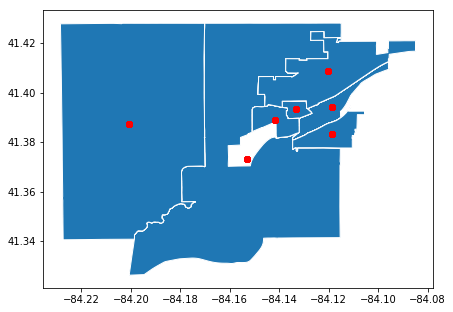

In [7]:
# look at only precincts that make up the *Napoleon* group of precincts
Napoleon_df = precincts_gdf[precincts_gdf["PRECINCT"]=='Napoleon'].copy()

# allocate empty lists for latitude and longitude of each of these precincts
Nap_lon = []
Nap_lat = []

# loop over all precincts Napoleon
for i in range(0,Napoleon_df.shape[0]):
    lon = Napoleon_df.iloc[i]["geometry"].centroid.coords[0][0]
    lat = Napoleon_df.iloc[i]["geometry"].centroid.coords[0][1]
    #print(lon, lat)
    Nap_lon.append(lon)
    Nap_lat.append(lat)
    
# convert lists to dataframes
Nap_lon_df = pd.DataFrame(Nap_lon)
Nap_lat_df = pd.DataFrame(Nap_lat)
#print(Nap_lon_df.shape)
#print(type(Nap_lon_df))
Nap_lon_df.head()

# reset row indices (index) so that index matches on columns to be added
Napoleon_df.reset_index(inplace=True)

# add lon/lat columns to original Napoleon_df dataframe to plot
Napoleon_df["centroid_lon"] = Nap_lon_df
Napoleon_df["centroid_lat"] = Nap_lat_df
#print(Napoleon_df.shape)
Napoleon_df.head()

# plot Napoleon precincts
Napoleon_df.plot(figsize=[7,7], edgecolor='white')

# plot centroid of each Napoleon precincts
for i in range(0,Napoleon_df.shape[0]):
        
    plt.scatter(Napoleon_df.iloc[i]["centroid_lon"], 
                Napoleon_df.iloc[i]["centroid_lat"], 
                color='r')

### Clean up dataframe

In [8]:
# indices columns containing raw vote counts
i_start = precincts_gdf.columns.get_loc("pres_16_james_jerome_bell_wi")
i_end = precincts_gdf.columns.get_loc("pres_16_donald_j_trump_r")

In [9]:
# drop any row that has a null/NaN/inf value in ANY of the vote count columns
for i in range(i_start,i_end+1):
    precincts_gdf = precincts_gdf[~pd.isnull(precincts_gdf.iloc[:,i])].copy()

In [10]:
# reset row index values to for easy looping AND to add new columns (index values must match)
precincts_gdf.reset_index(inplace=True)

In [11]:
# remove COLUMN named 'index'
precincts_gdf.drop('index', axis=1, inplace=True)

In [12]:
# only keep rows with non-empty geometry cells (make copy to avoid slice overwriting)
ohio_df = precincts_gdf[~precincts_gdf["geometry"].is_empty].copy()

### Find centroids for all precincts

In [13]:
# allocate empty lists for latitude and longitude
oh_lon = []
oh_lat = []

# loop over all precincts Napoleon
for i in range(0,ohio_df.shape[0]):
    lon = ohio_df.iloc[i]["geometry"].centroid.coords[0][0]
    lat = ohio_df.iloc[i]["geometry"].centroid.coords[0][1]
    oh_lon.append(lon)
    oh_lat.append(lat)
    
# convert lists to dataframes
oh_lon_df = pd.DataFrame(oh_lon)
oh_lat_df = pd.DataFrame(oh_lat)
#print(Nap_lon_df.shape, Nap_lat_df.shape)

In [14]:
# add lon/lat columns to original Napoleon_df dataframe to plot
ohio_df["centroid_lon"] = oh_lon_df
ohio_df["centroid_lat"] = oh_lat_df

### Create "winner" column (essentially a binary/boolean...)

In [15]:
# list of columns that contain vote counts
vote_columns = ['pres_16_james_jerome_bell_wi',
       'pres_16_michael_bickelmeyer_wi', 'pres_16_darrell_l_castle_wi',
       'pres_16_hillary_clinton_d', 'pres_16_richard_duncan',
       'pres_16_cherunda_fox_wi', 'pres_16_ben_hartnell_wi',
       'pres_16_tom_hoefling_wi', 'pres_16_bruce_e_jaynes_wi',
       'pres_16_gary_johnson', 'pres_16_chris_keniston_wi',
       'pres_16_barry_kirschner_wi', 'pres_16_laurence_kotlikoff_wi',
       'pres_16_joseph_maldonado_wi', 'pres_16_michael_andrew_maturen_wi',
       'pres_16_evan_mc_mullin_wi', 'pres_16_monica_moorehead_wi',
       'pres_16_joe_schriner_wi', 'pres_16_mike_smith_wi',
       'pres_16_jill_stein_g', 'pres_16_josiah_r_stroh_wi',
       'pres_16_douglas_w_thomson_wi', 'pres_16_donald_j_trump_r']

In [16]:
# create column with lead vote winner name
ohio_df["winner"] = ohio_df[vote_columns].astype(int).idxmax(axis='columns')

In [17]:
# create empty list containing for winner as binary: 0/1 == Trump/Hillary
win_bi = []

# assign binary values...
for i in range(0,ohio_df.shape[0]):
    if (ohio_df.iloc[i]["winner"] == "pres_16_donald_j_trump_r"):
        win_bi.append(0)
    elif (ohio_df.iloc[i]["winner"] == "pres_16_hillary_clinton_d"):
        win_bi.append(1)
    else:
        print("else @ i=",i)
        #win_bi.append(2)
        
#win_bi
ohio_df["winner_binary"] = win_bi

In [18]:
# check final dataframe (last 5 columns are most relevant)
print(ohio_df.shape)
ohio_df.head()

(10295, 42)


,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


### Plot electoral map

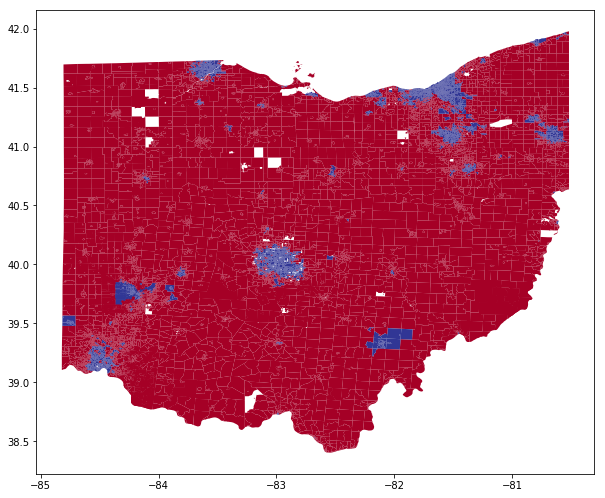

In [19]:
# plot Trump precincts as red and Clinton states as blue
ohio_df.plot(column='winner_binary', figsize=[10,10], cmap='RdYlBu')

In [20]:
# convert back to original CRS
ohio_df = ohio_df.to_crs(epsg=2958)
ohio_df.head()

,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((394208.1309668442 4296804...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((399776.4066106104 4299391...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((395684.3247016144 4297527...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((399263.2164539802 4309896...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((394490.6016695436 4310216...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


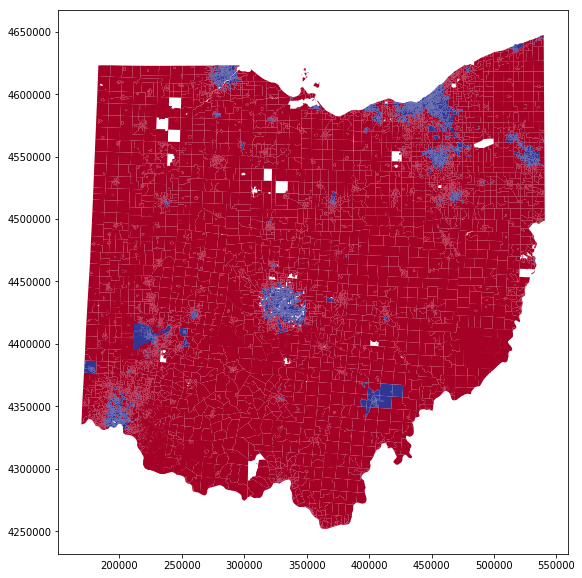

In [21]:
# plot again
ohio_df.plot(column='winner_binary', figsize=[10,10], cmap='RdYlBu')

In [22]:
# then back again to lat/lon
ohio_df = ohio_df.to_crs(epsg=4326)
ohio_df.head()

,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


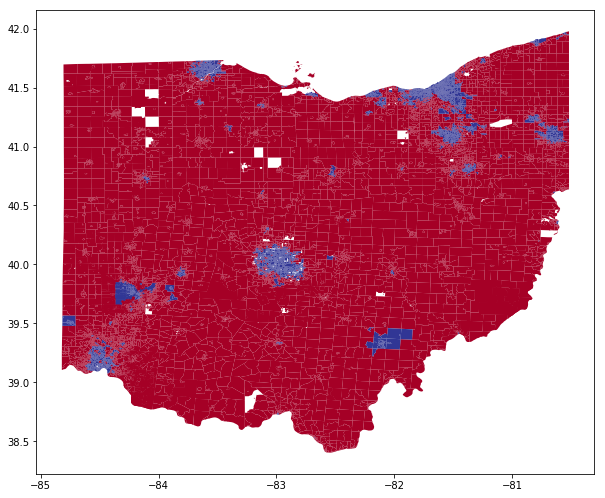

In [23]:
# plot again
ohio_df.plot(column='winner_binary', figsize=[10,10], cmap='RdYlBu')

# Foursquare venue data

In [53]:
# del precinct_venues
# del precinct_onehot
# del precinct_grouped
# del df_merged

In [24]:
# # import libraries
# import numpy as np 

# JSON files...
import json

# !conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
# from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# # Matplotlib and associated plotting modules
# import matplotlib.cm as cm
# import matplotlib.colors as colors

# # import k-means from clustering stage
# from sklearn.cluster import KMeans

# !conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
# import folium # map rendering library

In [25]:
# check out our dataframe of neighborhood data
print('The dataframe has voting data for {} precincts and {} precinct voting sections.'.format(
        len(ohio_df['PRECINCT'].unique()),
        ohio_df.shape[0]
    )
)

The dataframe has voting data for 8653 precincts and 10295 precinct voting sections.


In [26]:
# Foursqaure credentials and version info
CLIENT_ID = 'LP5VHPFD4PUKCOMHHJALFLDBF5INH5IUO45AYV4RZXDE505R' # your Foursquare ID
CLIENT_SECRET = 'VXXTJLOK5SACL4AMNMONAATB3UR4JSOST2OLF4PBJZMPE0RG' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Credentails:
CLIENT_ID: LP5VHPFD4PUKCOMHHJALFLDBF5INH5IUO45AYV4RZXDE505R
CLIENT_SECRET:VXXTJLOK5SACL4AMNMONAATB3UR4JSOST2OLF4PBJZMPE0RG


In [491]:
# Create a function to "explore" (get venues for) all the precincts
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT = 100):
    
    # allocate empty venues list
    venues_list=[]
    
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        #results = requests.get(url).json()["response"]['groups'][0]['items']
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except:
            print(name)
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Precinct_ID', 
                  'Precinct Latitude', 
                  'Precinct Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

"The Foursquare API has a limit of 950 Regular API Calls per day". 
Below, two indices (162 and 814) did not return any venues. 
So, by index = 2 + max = 2 + 950 = 952, the following message was returned: 

If the lat/lon does not have any venues within the radius specified, the following is returned:

In [ ]:
# # call the function
# precinct_venues = getNearbyVenues(names=pd.Series(ohio_df.index.values),
#                                  latitudes=ohio_df['centroid_lat'],
#                                  longitudes=ohio_df['centroid_lon']
#                                  )

In [ ]:
# # save the dataframe of Foursquare information to a CSV file
# precinct_venues.to_csv("precinct_venues_FQ.csv")

## *FOURSQUARE ONLY ALLOWS 5000 CALLS PER HOUR. THEREFORE, WE SHOULD MANUALLY LIMIT THE CALLS, AND DO IT BATCHES...*

For the index values (Precinct_ID) printed below, there were no venues (3891 and 4531) OR the maximum calls to the API had been met (5000+). Therefore, this is a totally unusable dataset as-is. Need to revise the function to: (i) return an "empty" JSON object; and (ii) only make 5000 calls, so that the data is acquired in 5000-precinct batches.

In [492]:
# call the function
precinct_venues_3500 = getNearbyVenues(names=pd.Series(ohio_df.index.values),
                                 latitudes=ohio_df['centroid_lat'],
                                 longitudes=ohio_df['centroid_lon']
                                 )

3891
4531
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197


6637
6638
6639
6640
6641
6642
6643
6644
6645
6646
6647
6648
6649
6650
6651
6652
6653
6654
6655
6656
6657
6658
6659
6660
6661
6662
6663
6664
6665
6666
6667
6668
6669
6670
6671
6672
6673
6674
6675
6676
6677
6678
6679
6680
6681
6682
6683
6684
6685
6686
6687
6688
6689
6690
6691
6692
6693
6694
6695
6696
6697
6698
6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715
6716
6717
6718
6719
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6747
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757
6758
6759
6760
6761
6762
6763
6764
6765
6766
6767
6768
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836


8276
8277
8278
8279
8280
8281
8282
8283
8284
8285
8286
8287
8288
8289
8290
8291
8292
8293
8294
8295
8296
8297
8298
8299
8300
8301
8302
8303
8304
8305
8306
8307
8308
8309
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8342
8343
8344
8345
8346
8347
8348
8349
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398
8399
8400
8401
8402
8403
8404
8405
8406
8407
8408
8409
8410
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475


9916
9917
9918
9919
9920
9921
9922
9923
9924
9925
9926
9927
9928
9929
9930
9931
9932
9933
9934
9935
9936
9937
9938
9939
9940
9941
9942
9943
9944
9945
9946
9947
9948
9949
9950
9951
9952
9953
9954
9955
9956
9957
9958
9959
9960
9961
9962
9963
9964
9965
9966
9967
9968
9969
9970
9971
9972
9973
9974
9975
9976
9977
9978
9979
9980
9981
9982
9983
9984
9985
9986
9987
9988
9989
9990
9991
9992
9993
9994
9995
9996
9997
9998
9999
10000
10001
10002
10003
10004
10005
10006
10007
10008
10009
10010
10011
10012
10013
10014
10015
10016
10017
10018
10019
10020
10021
10022
10023
10024
10025
10026
10027
10028
10029
10030
10031
10032
10033
10034
10035
10036
10037
10038
10039
10040
10041
10042
10043
10044
10045
10046
10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
1009

In [497]:
# check the index values (what will become 'Precinct_ID') that were printed above... 
# index values = 3891, 4531, 5000+
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3891].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3891]

(1, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
195430,3891,39.056316,-82.110355,Fay's Kitchen,39.177325,-81.921321,Diner


In [498]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3890].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3890]

(1, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
195429,3890,39.156675,-81.904232,Fay's Kitchen,39.177325,-81.921321,Diner


In [500]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3892].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==3892].head()

(19, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
195431,3892,39.018282,-82.047924,McDonald's,39.019704,-82.041821,Fast Food Restaurant
195432,3892,39.018282,-82.047924,Court Street Grill,39.027269,-82.033560,Bar
195433,3892,39.018282,-82.047924,Fox's Pizza Den,39.030043,-82.024049,Pizza Place
195434,3892,39.018282,-82.047924,SUBWAY,39.008716,-82.045255,Sandwich Place
195435,3892,39.018282,-82.047924,Wendy's,39.030410,-82.021688,Fast Food Restaurant


In [501]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4531].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4531].head()

(10, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
218955,4531,39.17334,-84.285386,Shaw Farms Produce,39.175081,-84.184711,Farmers Market
218956,4531,39.17334,-84.285386,Hot Head Burritos,39.169869,-84.201384,Mexican Restaurant
218957,4531,39.17334,-84.285386,Miami Rifle & Pistol Club,39.147602,-84.173267,Gun Range
218958,4531,39.17334,-84.285386,At Your Serive R and R,39.166066,-84.173913,Construction & Landscaping
218959,4531,39.17334,-84.285386,Rousters Apple House,39.172935,-84.162265,Farmers Market


In [502]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4530].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4530].head()

(10, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
218945,4530,39.155933,-84.173676,Shaw Farms Produce,39.175081,-84.184711,Farmers Market
218946,4530,39.155933,-84.173676,Hot Head Burritos,39.169869,-84.201384,Mexican Restaurant
218947,4530,39.155933,-84.173676,Miami Rifle & Pistol Club,39.147602,-84.173267,Gun Range
218948,4530,39.155933,-84.173676,At Your Serive R and R,39.166066,-84.173913,Construction & Landscaping
218949,4530,39.155933,-84.173676,Rousters Apple House,39.172935,-84.162265,Farmers Market


In [503]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4532].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4532].head()

(73, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
218965,4532,39.17334,-84.285386,Lehr's Prime Market,39.176996,-84.284726,Butcher
218966,4532,39.17334,-84.285386,Skyline Chili,39.176131,-84.285283,American Restaurant
218967,4532,39.17334,-84.285386,20 Brix,39.172902,-84.296303,Wine Bar
218968,4532,39.17334,-84.285386,By Golly's,39.176473,-84.286242,American Restaurant
218969,4532,39.17334,-84.285386,Little Miami Scenic Trail,39.171440,-84.299632,Trail


In [504]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4999].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==4999].head()

(41, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
232615,4999,39.143534,-84.268957,Mint Bistro,39.157796,-84.275491,Thai Restaurant
232616,4999,39.143534,-84.268957,Texas Roadhouse,39.160694,-84.271522,Steakhouse
232617,4999,39.143534,-84.268957,Homewood Suites by Hilton Cincinnati...,39.158769,-84.272659,Hotel
232618,4999,39.143534,-84.268957,Dos Amigos,39.160757,-84.274344,Mexican Restaurant
232619,4999,39.143534,-84.268957,Cincinnati Nature Center (Rowe Woods),39.125292,-84.245714,Trail


In [505]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==5000].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==5000].head()

(41, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
232656,5000,39.143534,-84.268957,Mint Bistro,39.157796,-84.275491,Thai Restaurant
232657,5000,39.143534,-84.268957,Texas Roadhouse,39.160694,-84.271522,Steakhouse
232658,5000,39.143534,-84.268957,Homewood Suites by Hilton Cincinnati...,39.158769,-84.272659,Hotel
232659,5000,39.143534,-84.268957,Dos Amigos,39.160757,-84.274344,Mexican Restaurant
232660,5000,39.143534,-84.268957,Cincinnati Nature Center (Rowe Woods),39.125292,-84.245714,Trail


In [506]:
print(precinct_venues_3500[precinct_venues_3500['Precinct_ID']==6666].shape)
precinct_venues_3500[precinct_venues_3500['Precinct_ID']==6666].head()

(41, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
300962,6666,40.787129,-81.409237,Mint Bistro,39.157796,-84.275491,Thai Restaurant
300963,6666,40.787129,-81.409237,Texas Roadhouse,39.160694,-84.271522,Steakhouse
300964,6666,40.787129,-81.409237,Homewood Suites by Hilton Cincinnati...,39.158769,-84.272659,Hotel
300965,6666,40.787129,-81.409237,Dos Amigos,39.160757,-84.274344,Mexican Restaurant
300966,6666,40.787129,-81.409237,Cincinnati Nature Center (Rowe Woods),39.125292,-84.245714,Trail


In [493]:
# check it
print(precinct_venues_3500.shape)
print(precinct_venues_3500.columns)
precinct_venues_3500.head()

(449751, 7)
Index(['Precinct_ID', 'Precinct Latitude', 'Precinct Longitude', 'Venue',
       'Venue Latitude', 'Venue Longitude', 'Venue Category'],
      dtype='object')


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,Courtside Bar And Grill,38.806786,-82.206826,Bar
1,0,38.806066,-82.213177,Shake Shoppe,38.814543,-82.194659,Fast Food Restaurant
2,0,38.806066,-82.213177,Dollar General,38.807222,-82.206783,Discount Store
3,0,38.806066,-82.213177,Speedway,38.813934,-82.197190,Gas Station
4,0,38.806066,-82.213177,Tuscany Cuccini,38.817761,-82.185092,Italian Restaurant


In [495]:
# save the dataframe of Foursquare information to a CSV file
precinct_venues_3500.to_csv("precinct_venues_3500_FQ.csv")

### New function to call Foursquare API

Just don't include precincts w/o any venues and keep a list so that they can be added back in later with all relevant info except 'Venue Category' ==> 'None'.

In [ ]:
# Create a function to "explore" (get venues for) all the precincts
def getNearbyVenues5000(names, latitudes, longitudes, radius=3500, LIMIT = 100):
    
    # allocate empty venues list
    venues_list=[]
    
    # allocate empty list precinct IDs that have no venues
    
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        #results = requests.get(url).json()["response"]['groups'][0]['items']
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
            # return only relevant information for each nearby venue
            venues_list.append([(
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])
        except:
            print(name)

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Precinct_ID', 
                  'Precinct Latitude', 
                  'Precinct Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [531]:
print(ohio_df.shape)
ohio_df.head()

(10295, 43)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


In [508]:
ohio_df.index.values

array([    0,     1,     2, ..., 10292, 10293, 10294])

Since we can only make 5000 calls/hour, only make the calls for first 5000 values...

In [519]:
print(ohio_df.iloc[0:5000,:].shape)
ohio_df.iloc[0:5000,:].head()

(5000, 43)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


In [518]:
ohio_df.iloc[0:5000,:].tail()

,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
4995,4995,UNION TWP U1U,clermont,13632.0,39025.0,UNION TOWNSHIP U1U,AHY,None,Clermont,AHY,Southwest,Cincinnati,715.0,554.0,77.48,0.0,0.0,0.0,164.0,4.0,0.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,351.0,(POLYGON ((-84.24072548261034 39.078...,-84.245255,39.078994,pres_16_donald_j_trump_r,0
4996,4996,UNION TWP U1U,clermont,13634.0,39025.0,UNION TOWNSHIP U1U,AHY,None,Clermont,AHY,Southwest,Cincinnati,715.0,554.0,77.48,0.0,0.0,0.0,164.0,4.0,0.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,351.0,(POLYGON ((-84.24072548261034 39.078...,-84.245255,39.078994,pres_16_donald_j_trump_r,0
4997,4997,UNION TWP R1R,clermont,13635.0,39025.0,UNION TOWNSHIP R1R,AHP,None,Clermont,AHP,Southwest,Cincinnati,877.0,643.0,73.32,0.0,0.0,0.0,206.0,1.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,405.0,(POLYGON ((-84.25100387372289 39.079...,-84.258104,39.085298,pres_16_donald_j_trump_r,0
4998,4998,UNION TWP S1S,clermont,13636.0,39025.0,UNION TOWNSHIP S1S,AHX,None,Clermont,AHX,Southwest,Cincinnati,912.0,758.0,83.11,0.0,0.0,0.0,213.0,1.0,0.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,482.0,(POLYGON ((-84.28670837820685 39.138...,-84.273833,39.145485,pres_16_donald_j_trump_r,0
4999,4999,UNION TWP A,clermont,13464.0,39025.0,UNION TOWNSHIP A,AEY,None,Clermont,AEY,Southwest,Cincinnati,1009.0,803.0,79.58,0.0,0.0,0.0,219.0,2.0,0.0,0.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,525.0,(POLYGON ((-84.26706965045538 39.166...,-84.268957,39.143534,pres_16_donald_j_trump_r,0


In [517]:
ohio_df.iloc[0:5000,:].index.values

array([   0,    1,    2, ..., 4997, 4998, 4999])

In [515]:
ilat = ohio_df.columns.get_loc("centroid_lat")
ilon = ohio_df.columns.get_loc("centroid_lon")
print(ilat, ilon)

40 39


In [516]:
print(ohio_df.iloc[0:5000,ilat].shape)
ohio_df.iloc[0:5000,ilat].head()

(5000,)


0    38.806066
1    38.824904
2    38.816566
3    38.890661
4    38.969485
Name: centroid_lat, dtype: float64

In [520]:
# call the function
precinct_venues_3500_1 = getNearbyVenues(names=pd.Series(ohio_df.iloc[0:5000,:].index.values),
                                 latitudes=ohio_df.iloc[0:5000,ilat],
                                 longitudes=ohio_df.iloc[0:5000,ilon]
                                 )

1185
1262
1369
1497
1997
2009
2010
2055
2801
2815
3936


In [528]:
# # save the dataframe of Foursquare information to a CSV file
# precinct_venues_3500_1.to_csv("precinct_venues_3500_1_FQ.csv")

In [522]:
print(precinct_venues_3500_1.shape)
precinct_venues_3500_1.head()

(232740, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,Courtside Bar And Grill,38.806786,-82.206826,Bar
1,0,38.806066,-82.213177,Shake Shoppe,38.814543,-82.194659,Fast Food Restaurant
2,0,38.806066,-82.213177,Dollar General,38.807222,-82.206783,Discount Store
3,0,38.806066,-82.213177,Speedway,38.813934,-82.197190,Gas Station
4,0,38.806066,-82.213177,Tuscany Cuccini,38.817761,-82.185092,Italian Restaurant


In [523]:
precinct_venues_3500_1.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
232735,4999,39.143534,-84.268957,iyo,39.158250,-84.275039,Frozen Yogurt Shop
232736,4999,39.143534,-84.268957,Verizon Wireless @ Rivers Edge,39.159056,-84.275716,Mobile Phone Shop
232737,4999,39.143534,-84.268957,Ruby Tuesday,39.161576,-84.271743,American Restaurant
232738,4999,39.143534,-84.268957,Terrace Park Country Club,39.157412,-84.292904,Golf Course
232739,4999,39.143534,-84.268957,Walmart,39.159451,-84.279998,Big Box Store


In [525]:
print(precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1185].shape)
precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1185].head()

(34, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
46216,1185,40.94734,-83.600615,Flippin' Jimmy's,41.158591,-83.414960,Wings Joint
46217,1185,40.94734,-83.600615,Kroger,41.162786,-83.415521,Supermarket
46218,1185,40.94734,-83.600615,KemoSabes Roadhouse Grill,41.165586,-83.401202,American Restaurant
46219,1185,40.94734,-83.600615,Wendy's,41.170776,-83.420549,Fast Food Restaurant
46220,1185,40.94734,-83.600615,Family Video,41.159098,-83.414735,Video Game Store


In [526]:
print(precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1184].shape)
precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1184].head()

(34, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
46182,1184,41.14783,-83.428953,Flippin' Jimmy's,41.158591,-83.414960,Wings Joint
46183,1184,41.14783,-83.428953,Kroger,41.162786,-83.415521,Supermarket
46184,1184,41.14783,-83.428953,KemoSabes Roadhouse Grill,41.165586,-83.401202,American Restaurant
46185,1184,41.14783,-83.428953,Wendy's,41.170776,-83.420549,Fast Food Restaurant
46186,1184,41.14783,-83.428953,Family Video,41.159098,-83.414735,Video Game Store


In [527]:
print(precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1186].shape)
precinct_venues_3500_1[precinct_venues_3500_1['Precinct_ID']==1186].head()

(82, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
46250,1186,41.076808,-83.646458,Jeffrey's Antique Gallery,41.090520,-83.660878,Antique Shop
46251,1186,41.076808,-83.646458,George House Coffee & Tea Co.,41.054304,-83.649662,Coffee Shop
46252,1186,41.076808,-83.646458,Millers Meats,41.059065,-83.656308,BBQ Joint
46253,1186,41.076808,-83.646458,Texas Roadhouse,41.057187,-83.670250,Steakhouse
46254,1186,41.076808,-83.646458,Culver's,41.059148,-83.665977,Fast Food Restaurant


In [ ]:
# add rows to dataframe for the precincts without venues
# leave everything blank except 'Venue Category'




## Let's make some small batch calls to Foursquare API to figure out what's happening when there are no venues found....

Here is the function again...

In [546]:
# test precinct_ID
id_test = 2

# lat/lon values
lat = ohio_df.iloc[id_test,ilat]
lng = ohio_df.iloc[id_test,ilon]

# radius
radius = 500

# LIMIT
LIMIT = 100

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=LP5VHPFD4PUKCOMHHJALFLDBF5INH5IUO45AYV4RZXDE505R&client_secret=VXXTJLOK5SACL4AMNMONAATB3UR4JSOST2OLF4PBJZMPE0RG&v=20180605&ll=38.816566189160056,-82.21152170557181&radius=500&limit=100'

In [548]:
results_2 = requests.get(url).json()["response"]['groups'][0]['items']

[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4d7909dcf20c236a8767a441',
   'name': 'Gallia County Convention & Visitors Bureau',
   'location': {'address': '441 2nd Ave',
    'lat': 38.813881,
    'lng': -82.210463,
    'labeledLatLngs': [{'label': 'display',
      'lat': 38.813881,
      'lng': -82.210463}],
    'distance': 312,
    'postalCode': '45631',
    'cc': 'US',
    'city': 'Gallipolis',
    'state': 'OH',
    'country': 'United States',
    'formattedAddress': ['441 2nd Ave',
     'Gallipolis, OH 45631',
     'United States']},
   'categories': [{'id': '4f4530164b9074f6e4fb00ff',
     'name': 'Tourist Information Center',
     'pluralName': 'Tourist Information Centers',
     'shortName': 'Tourist Information',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/touristinformation_',
      'suffix': '.png'},
     'primary': True}],
   '

In [ ]:
results

In [549]:
# test precinct_ID
id_test = 3

# lat/lon values
lat = ohio_df.iloc[id_test,ilat]
lng = ohio_df.iloc[id_test,ilon]

# radius
radius = 500

# LIMIT
LIMIT = 100

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=LP5VHPFD4PUKCOMHHJALFLDBF5INH5IUO45AYV4RZXDE505R&client_secret=VXXTJLOK5SACL4AMNMONAATB3UR4JSOST2OLF4PBJZMPE0RG&v=20180605&ll=38.89066120660996,-82.178235438107&radius=500&limit=100'

In [550]:
results_3 = requests.get(url).json()["response"]['groups'][0]['items']

In [551]:
results_3

[]

In [562]:
# import libraries to deal w/ rejected API calls..
#import requests
from requests.adapters import HTTPAdapter
from requests.packages.urllib3.util.retry import Retry

In [570]:
# Create a function to "explore" (get venues for) all the precincts
def getNearbyVenuesTest(names, latitudes, longitudes, radius=3500, LIMIT = 100):
    
    # allocate empty venues list
    venues_list=[]
    
    # allocate empty list for Precinct_ID's without venues
    none_ID = []
    
    for name, lat, lng in zip(names, latitudes, longitudes):
        
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
#         results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # if FQ API returns something...
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        # if FQ API rejects call, save ID and return empty list for now,
        # will call for these later
        except:
            print(name)
            none_ID.append(name)
            results = []
            errorWarning = requests.get(url).json()
            break

#         # if FQ API returns something...
#         try:
#             results = requests.get(url).json()["response"]['groups'][0]['items']
#         # if FQ API rejects call, save ID and return empty list for now,
#         # will call for these later
#         except:
#             print(name)
#             none_ID.append(name)
#             results = []
#.            break
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Precinct_ID', 
                  'Precinct Latitude', 
                  'Precinct Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [566]:
# number of precincts to make calls for
id_start = 0
id_end   = 5000

# call the function
testvals = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

1649
1650
1651
1652
1653
1654
1655
1656
1657
1658
1659
1660
1661
1662
1663
1664
1665
1666
1667
1668
1669
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1716
1717
1718
1719
1720
1721
1722
1723
1724
1725
1726
1727
1728
1729
1730
1731
1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
1771
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826
1827
1828
1829
1830
1831
1832
1833
1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1844
1845
1846
1847
1848


3355
3356
3357
3358
3359
3360
3361
3362
3363
3364
3365
3366
3367
3368
3369
3370
3371
3372
3373
3374
3375
3376
3377
3378
3379
3380
3381
3382
3383
3384
3385
3386
3387
3388
3389
3390
3391
3392
3393
3394
3395
3396
3397
3398
3399
3400
3401
3402
3403
3404
3405
3406
3407
3408
3409
3410
3411
3412
3413
3414
3415
3416
3417
3418
3419
3420
3421
3422
3423
3424
3425
3426
3427
3428
3429
3430
3431
3432
3433
3434
3435
3436
3437
3438
3439
3440
3441
3442
3443
3444
3445
3446
3447
3448
3449
3450
3451
3452
3453
3454
3455
3456
3457
3458
3459
3460
3461
3462
3463
3464
3465
3466
3467
3468
3469
3470
3471
3472
3473
3474
3475
3476
3477
3478
3479
3480
3481
3482
3483
3484
3485
3486
3487
3488
3489
3490
3491
3492
3493
3494
3495
3496
3497
3498
3499
3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554


In [567]:
print(testvals.shape)
testvals.head(10)

(63699, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,Courtside Bar And Grill,38.806786,-82.206826,Bar
1,0,38.806066,-82.213177,Shake Shoppe,38.814543,-82.194659,Fast Food Restaurant
2,0,38.806066,-82.213177,Dollar General,38.807222,-82.206783,Discount Store
3,0,38.806066,-82.213177,Speedway,38.813934,-82.197190,Gas Station
4,0,38.806066,-82.213177,Tuscany Cuccini,38.817761,-82.185092,Italian Restaurant
5,0,38.806066,-82.213177,Little Caesars Pizza,38.814399,-82.195151,Pizza Place
6,0,38.806066,-82.213177,BP,38.805446,-82.213247,Gas Station
7,0,38.806066,-82.213177,Pizza Hut,38.818726,-82.181379,Pizza Place
8,0,38.806066,-82.213177,Ariel Theatre,38.808708,-82.204617,Performing Arts Venue
9,0,38.806066,-82.213177,Fat Boyz Pizza,38.818909,-82.230214,Pizza Place


In [568]:
testvals.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
63694,1647,40.969309,-84.181107,Huntington Bank,40.980914,-84.196723,Bank
63695,1647,40.969309,-84.181107,Dick's Steak House,40.981994,-84.201376,Steakhouse
63696,1647,40.969309,-84.181107,Dollar General,40.975567,-84.208480,Department Store
63697,1647,40.969309,-84.181107,Four Seasons Park,40.989520,-84.207660,Park
63698,1648,40.989717,-84.125550,Siefker Real Estate & Auction Co Ltd,40.974068,-84.092826,Antique Shop


In [569]:
testvals['Precinct_ID'].max()

1648

In [571]:
# number of precincts to make calls for
id_start = testvals['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals2 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

2408


In [572]:
print(testvals2.shape)
testvals2.head()

(35250, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,1650,41.103636,-84.130093,Buckeye Club,41.101946,-84.131654,Bar
1,1651,41.119335,-84.147736,Buckeye Club,41.101946,-84.131654,Bar
2,1652,41.124547,-84.196408,Vandehey Corp,41.150288,-84.207673,Home Service
3,1652,41.124547,-84.196408,German Machinery Imports,41.150944,-84.207337,Construction & Landscaping
4,1654,41.019755,-84.300142,Troyer's Tavern,41.019787,-84.304580,Bar


In [573]:
testvals2.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
35245,2407,41.171206,-81.48305,Schwebel's Bakery Outlet,41.171342,-81.508902,Bakery
35246,2407,41.171206,-81.48305,Baumann's Florist,41.190092,-81.463532,Flower Shop
35247,2407,41.171206,-81.48305,Pekar Music Company,41.146884,-81.470946,Music Store
35248,2407,41.171206,-81.48305,Silver Lake Florist,41.151833,-81.455494,Flower Shop
35249,2407,41.171206,-81.48305,CrossFit Akron North,41.191196,-81.452637,Gym


In [578]:
# test precinct_ID
id_test = 1649

# lat/lon values
lat = ohio_df.iloc[id_test,ilat]
lng = ohio_df.iloc[id_test,ilon]

# radius
radius = 3500

# LIMIT
LIMIT = 100

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=LP5VHPFD4PUKCOMHHJALFLDBF5INH5IUO45AYV4RZXDE505R&client_secret=VXXTJLOK5SACL4AMNMONAATB3UR4JSOST2OLF4PBJZMPE0RG&v=20180605&ll=40.94581221947662,-84.13110080547261&radius=3500&limit=100'

In [579]:
results_1649 = requests.get(url).json()["response"]['groups'][0]['items']

In [580]:
results_1649

[]

In [581]:
testvals2['Precinct_ID'].max()

2407

In [589]:
testappend = testvals.append(testvals2)

In [591]:
testvals.shape[0]+testvals2.shape[0]

98949

In [590]:
print(testappend.shape)
testappend.head()

(98949, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,Courtside Bar And Grill,38.806786,-82.206826,Bar
1,0,38.806066,-82.213177,Shake Shoppe,38.814543,-82.194659,Fast Food Restaurant
2,0,38.806066,-82.213177,Dollar General,38.807222,-82.206783,Discount Store
3,0,38.806066,-82.213177,Speedway,38.813934,-82.197190,Gas Station
4,0,38.806066,-82.213177,Tuscany Cuccini,38.817761,-82.185092,Italian Restaurant


In [592]:
testappend.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
35245,2407,41.171206,-81.48305,Schwebel's Bakery Outlet,41.171342,-81.508902,Bakery
35246,2407,41.171206,-81.48305,Baumann's Florist,41.190092,-81.463532,Flower Shop
35247,2407,41.171206,-81.48305,Pekar Music Company,41.146884,-81.470946,Music Store
35248,2407,41.171206,-81.48305,Silver Lake Florist,41.151833,-81.455494,Flower Shop
35249,2407,41.171206,-81.48305,CrossFit Akron North,41.191196,-81.452637,Gym


In [593]:
# number of precincts to make calls for
id_start = testvals2['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals3 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

2999


In [594]:
print(testvals3.shape)
testvals3.head()

(42170, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,2408,41.184232,-81.449295,Bruegger's Bagels,41.199720,-81.439600,Bagel Shop
1,2408,41.184232,-81.449295,The Cafe in Stow,41.189464,-81.439935,Café
2,2408,41.184232,-81.449295,Parasson's Italian Restaurant,41.173252,-81.439730,Italian Restaurant
3,2408,41.184232,-81.449295,Gavin Scott Salon And Spa,41.200291,-81.441686,Cosmetics Shop
4,2408,41.184232,-81.449295,The Executive Coin Company,41.167367,-81.439475,Hobby Shop


In [595]:
testvals3.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
42165,2998,39.216254,-84.593442,Wet Pets,39.237383,-84.577111,Hobby Shop
42166,2998,39.216254,-84.593442,Pam's Diner,39.237383,-84.577111,Diner
42167,2998,39.216254,-84.593442,Pippin Market,39.237837,-84.576658,Convenience Store
42168,2998,39.216254,-84.593442,Speedway,39.187908,-84.602530,Gas Station
42169,2998,39.216254,-84.593442,Springdale Cleaners,39.190970,-84.597943,Dry Cleaner


In [596]:
testvals3['Precinct_ID'].max()

2998

In [597]:
# number of precincts to make calls for
id_start = testvals3['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals4 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

3080


In [598]:
print(testvals4.shape)
testvals4.head()

(6065, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,2999,39.246483,-84.606557,Xscape Theatres Northgate 14,39.244112,-84.598879,Movie Theater
1,2999,39.246483,-84.606557,Victoria's Secret PINK,39.244414,-84.599868,Lingerie Store
2,2999,39.246483,-84.606557,Quaker Steak & Lube,39.251662,-84.606860,Wings Joint
3,2999,39.246483,-84.606557,Five Guys Burgers and Fries,39.252500,-84.601691,Burger Joint
4,2999,39.246483,-84.606557,Ulta Beauty,39.244500,-84.596404,Cosmetics Shop


In [599]:
testvals4.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
6060,3079,39.152042,-84.62773,Gordon Food Service Store,39.159526,-84.630787,Market
6061,3079,39.152042,-84.62773,Graeter's Ice Cream,39.129687,-84.600455,Ice Cream Shop
6062,3079,39.152042,-84.62773,The Public House,39.155810,-84.606670,Bar
6063,3079,39.152042,-84.62773,Goodwill,39.162288,-84.605709,Thrift / Vintage Store
6064,3079,39.152042,-84.62773,Keller's,39.156018,-84.611280,Bar


In [600]:
testvals4['Precinct_ID'].max()

3079

In [601]:
# number of precincts to make calls for
id_start = testvals4['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals5 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

3081


In [602]:
print(testvals5.shape)
testvals5.head()

(94, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3080,39.15754,-84.638695,Graeter's Ice Cream,39.167087,-84.636409,Ice Cream Shop
1,3080,39.15754,-84.638695,Dewey's Pizza,39.167231,-84.636489,Pizza Place
2,3080,39.15754,-84.638695,Wild Mike's,39.164386,-84.629706,American Restaurant
3,3080,39.15754,-84.638695,Graeter's Ice Cream Western Hills,39.146721,-84.629656,Ice Cream Shop
4,3080,39.15754,-84.638695,Nick and Tom's,39.160045,-84.638776,American Restaurant


In [603]:
testvals5.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
89,3080,39.15754,-84.638695,Visitation Baseball Fields,39.144866,-84.667305,Baseball Field
90,3080,39.15754,-84.638695,Maribelle Cakery,39.154840,-84.605885,Bakery
91,3080,39.15754,-84.638695,stephens old village restaurant,39.155372,-84.605240,American Restaurant
92,3080,39.15754,-84.638695,"Diane's cake, candy, and cookie supp...",39.150884,-84.600597,Bakery
93,3080,39.15754,-84.638695,Kuliga Park,39.150604,-84.677094,Playground


In [604]:
testvals5['Precinct_ID'].max()

3080

In [605]:
# number of precincts to make calls for
id_start = testvals5['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals6 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

3512


In [606]:
print(testvals6.shape)
testvals6.head()

(34007, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3081,39.173731,-84.651681,Graeter's Ice Cream,39.167087,-84.636409,Ice Cream Shop
1,3081,39.173731,-84.651681,Dewey's Pizza,39.167231,-84.636489,Pizza Place
2,3081,39.173731,-84.651681,Penn Station,39.187672,-84.652072,Sandwich Place
3,3081,39.173731,-84.651681,First Watch,39.167556,-84.636739,Breakfast Spot
4,3081,39.173731,-84.651681,Mcalister’s deli,39.182006,-84.649411,Deli / Bodega


In [607]:
testvals6.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
34002,3511,41.723251,-83.666974,Whiteford Township Community Park,41.742942,-83.660788,Park
34003,3511,41.723251,-83.666974,Rachel Michaels Gourmet Popcorn,41.702757,-83.656166,Dessert Shop
34004,3511,41.723251,-83.666974,Rite Aid,41.720213,-83.625118,Pharmacy
34005,3511,41.723251,-83.666974,Stoneco,41.751184,-83.666896,Construction & Landscaping
34006,3511,41.723251,-83.666974,Beauchamp's Garden Center,41.749548,-83.653013,Flower Shop


In [608]:
testvals6['Precinct_ID'].max()

3511

In [609]:
# number of precincts to make calls for
id_start = testvals6['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals7 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

5723


In [610]:
print(testvals7.shape)
testvals7.head()

(90667, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3512,41.720213,-83.759097,Pacesetter Park,41.713047,-83.756471,Park
1,3512,41.720213,-83.759097,Mayberry Diner,41.714218,-83.743093,Diner
2,3512,41.720213,-83.759097,Funagin’s,41.708470,-83.742332,Paintball Field
3,3512,41.720213,-83.759097,Centennial Terrace,41.716035,-83.744976,Concert Hall
4,3512,41.720213,-83.759097,Highland Meadows Golf Club,41.717430,-83.722843,Golf Course


In [611]:
testvals7.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
90662,5722,39.912027,-83.095193,CCHS Stadium,39.898578,-83.114682,Athletics & Sports
90663,5722,39.912027,-83.095193,Commons At Sequoia Park,39.889930,-83.109185,Baseball Stadium
90664,5722,39.912027,-83.095193,Jay's,39.941930,-83.091946,Dive Bar
90665,5722,39.912027,-83.095193,Gotta Flip Gymnastics,39.916760,-83.134067,Gymnastics Gym
90666,5722,39.912027,-83.095193,La Michoacana,39.942234,-83.095863,Grocery Store


In [612]:
testvals7['Precinct_ID'].max()

5722

In [613]:
# number of precincts to make calls for
id_start = testvals7['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals8 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

5857


In [614]:
print(testvals8.shape)
testvals8.head()

(12605, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,5723,40.058738,-83.06301,Life Time Fitness,40.054820,-83.069140,Gym
1,5723,40.058738,-83.06301,Los Guachos Taqueria,40.064524,-83.057044,Taco Place
2,5723,40.058738,-83.06301,Bibibop Asian Grille,40.054802,-83.068416,Asian Restaurant
3,5723,40.058738,-83.06301,Hyde Park Steak House,40.051812,-83.062893,Steakhouse
4,5723,40.058738,-83.06301,City Egg,40.064127,-83.058756,Breakfast Spot


In [615]:
testvals8.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
12600,5856,39.92525,-83.133462,Raising Cane's Chicken Fingers,39.952940,-83.124223,Fried Chicken Joint
12601,5856,39.92525,-83.133462,Save A Lot,39.953072,-83.131088,Grocery Store
12602,5856,39.92525,-83.133462,PNC Bank,39.952510,-83.135000,Bank
12603,5856,39.92525,-83.133462,A&W All American Food,39.952893,-83.126739,Fast Food Restaurant
12604,5856,39.92525,-83.133462,KFC,39.952742,-83.129823,Fried Chicken Joint


In [616]:
testvals8['Precinct_ID'].max()

5856

In [617]:
# number of precincts to make calls for
id_start = testvals8['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals9 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

7053


In [618]:
print(testvals9.shape)
testvals9.head()

(63657, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,5857,39.915391,-83.126573,Chipotle Mexican Grill,39.919835,-83.126356,Mexican Restaurant
1,5857,39.915391,-83.126573,Red Lobster,39.920333,-83.125177,Seafood Restaurant
2,5857,39.915391,-83.126573,Starbucks,39.925614,-83.118602,Coffee Shop
3,5857,39.915391,-83.126573,Kroger Fuel Center,39.919993,-83.122403,Gas Station
4,5857,39.915391,-83.126573,Buybacks Entertainment,39.920748,-83.122328,Video Store


In [619]:
testvals9.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
63652,7052,41.298306,-81.600615,Red Lock Trailhead,41.289549,-81.563836,Park
63653,7052,41.298306,-81.600615,Greenwood Village Pool,41.311705,-81.564573,Pool
63654,7052,41.298306,-81.600615,Pilot Travel Center,41.276277,-81.626713,Gas Station
63655,7052,41.298306,-81.600615,Cuyahoga Valley National Park - Fort...,41.302939,-81.559244,Monument / Landmark
63656,7052,41.298306,-81.600615,Wendy's,41.276340,-81.626392,Fast Food Restaurant


In [620]:
testvals9['Precinct_ID'].max()

7052

In [621]:
# number of precincts to make calls for
id_start = testvals9['Precinct_ID'].max() + 1
id_end   = id_start + 5000

# call the function
testvals10 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

10100


In [622]:
print(testvals10.shape)
testvals10.head()

(173787, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,7053,41.288553,-81.653506,Starbucks,41.291965,-81.675839,Coffee Shop
1,7053,41.288553,-81.653506,Sleepy Hollow Golf Course,41.304070,-81.626583,Golf Course
2,7053,41.288553,-81.653506,Chipotle Mexican Grill,41.314093,-81.654662,Mexican Restaurant
3,7053,41.288553,-81.653506,Furnace Run Metro Park,41.268332,-81.639199,Trail
4,7053,41.288553,-81.653506,Stonewall Gun Shop & Pistol Range,41.315739,-81.656241,Gun Shop


In [623]:
testvals10.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
173782,10099,40.306262,-83.066688,Bauerle Automotive,40.293150,-83.086500,Automotive Shop
173783,10099,40.306262,-83.066688,"Kristin L. Campbell, OD",40.309270,-83.099900,Optical Shop
173784,10099,40.306262,-83.066688,23 South,40.332029,-83.073712,Travel & Transport
173785,10099,40.306262,-83.066688,Verizon Store,40.293079,-83.033806,Electronics Store
173786,10099,40.306262,-83.066688,Pony Lawncare and Landscaping,40.282370,-83.090444,Construction & Landscaping


In [624]:
testvals10['Precinct_ID'].max()

10099

In [626]:
print(ohio_df.shape[0])

10295


In [627]:
# number of precincts to make calls for
id_start = testvals10['Precinct_ID'].max() + 1
id_end   = ohio_df.shape[0]

# call the function
testvals11 = getNearbyVenuesTest(names=pd.Series(ohio_df.iloc[id_start:id_end,:].index.values),
                               latitudes=ohio_df.iloc[id_start:id_end,ilat],
                               longitudes=ohio_df.iloc[id_start:id_end,ilon]
                               )

In [628]:
print(testvals11.shape)
testvals11.head()

(6643, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,10100,40.305311,-83.054432,Mingo Park,40.306161,-83.060544,Playground
1,10100,40.305311,-83.054432,Dari Point,40.299345,-83.053275,Ice Cream Shop
2,10100,40.305311,-83.054432,12 West,40.298885,-83.068290,Mexican Restaurant
3,10100,40.305311,-83.054432,Vito's Wine Bar,40.297831,-83.068065,Wine Bar
4,10100,40.305311,-83.054432,Staas Brewing Company,40.300161,-83.069286,Brewery


In [629]:
testvals11.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
6638,10293,41.152188,-84.570025,Paulding Airport Inc Airport (2H8),41.165250,-84.556860,Airport
6639,10293,41.152188,-84.570025,Hometown Pizza,41.137173,-84.580188,Pizza Place
6640,10294,41.032801,-84.401259,Grandma's / Elegant Cakes,41.042712,-84.419622,Bakery
6641,10294,41.032801,-84.401259,Buckeye Trail,41.035007,-84.370766,Trail
6642,10294,41.032801,-84.401259,BlueWater Campgrounds,41.015998,-84.430593,Campground


In [630]:
testvals11['Precinct_ID'].max()

10294

In [631]:
ohio_df['Precinct_ID'].max()

10294

## ABLE TO GET ALL PRECINCTS DONE W/ MANUAL BATCH CALLS

Now aggregate all these batch df's

In [639]:
#del precinct_venues_agg

In [640]:
precinct_venues_agg = testvals.append(testvals2).append(testvals3).append(testvals4).append(testvals5).append(testvals6).append(testvals7).append(testvals8).append(testvals9).append(testvals10).append(testvals11)

In [641]:
print(precinct_venues_agg.shape)
precinct_venues_agg.head()

(528644, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,Courtside Bar And Grill,38.806786,-82.206826,Bar
1,0,38.806066,-82.213177,Shake Shoppe,38.814543,-82.194659,Fast Food Restaurant
2,0,38.806066,-82.213177,Dollar General,38.807222,-82.206783,Discount Store
3,0,38.806066,-82.213177,Speedway,38.813934,-82.197190,Gas Station
4,0,38.806066,-82.213177,Tuscany Cuccini,38.817761,-82.185092,Italian Restaurant


In [642]:
precinct_venues_agg.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
6638,10293,41.152188,-84.570025,Paulding Airport Inc Airport (2H8),41.165250,-84.556860,Airport
6639,10293,41.152188,-84.570025,Hometown Pizza,41.137173,-84.580188,Pizza Place
6640,10294,41.032801,-84.401259,Grandma's / Elegant Cakes,41.042712,-84.419622,Bakery
6641,10294,41.032801,-84.401259,Buckeye Trail,41.035007,-84.370766,Trail
6642,10294,41.032801,-84.401259,BlueWater Campgrounds,41.015998,-84.430593,Campground


In [643]:
# save the dataframe of Foursquare information to a CSV file
precinct_venues_agg.to_csv("precinct_venues_agg_FQ.csv")

In [54]:
# load the cached Foursqaure data (rather make calls to FQ API again)
precinct_venues = pd.read_csv("precinct_venues_FQ.csv")

In [558]:
# check it
print(precinct_venues.shape)
print(precinct_venues.columns)
precinct_venues.head(10)

(22507, 7)
Index(['Precinct_ID', 'Precinct Latitude', 'Precinct Longitude', 'Venue',
       'Venue Latitude', 'Venue Longitude', 'Venue Category'],
      dtype='object')


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,BP,38.805446,-82.213247,Gas Station
1,0,38.806066,-82.213177,Foodland,38.806978,-82.209135,Market
2,0,38.806066,-82.213177,Remo's Hotdogs,38.806038,-82.208049,Italian Restaurant
3,0,38.806066,-82.213177,Uncle Kenny's Saloon,38.806973,-82.207941,Bar
4,1,38.824904,-82.177677,Cliffside Golf Course,38.826450,-82.179614,Golf Course
5,1,38.824904,-82.177677,Tudor's Biscuit World,38.822232,-82.174009,Comfort Food Restaurant
6,1,38.824904,-82.177677,Tutors,38.822088,-82.173808,Restaurant
7,12,38.589927,-82.291059,Dollar General,38.589978,-82.285981,Discount Store
8,12,38.589927,-82.291059,Dairy Boy,38.587092,-82.289933,Ice Cream Shop
9,12,38.589927,-82.291059,Crown City Park,38.589635,-82.286696,Park


In [559]:
precinct_venues.tail(10)

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
22497,10259,39.966207,-81.529837,Faith Community Childcare,39.967130,-81.534648,Home Service
22498,10264,39.983203,-81.460077,Lore City Field,39.982863,-81.459588,Baseball Field
22499,10275,41.179778,-84.737693,SUBWAY,41.181033,-84.740333,Sandwich Place
22500,10275,41.179778,-84.737693,Oasis Bar,41.180853,-84.740603,Bar
22501,10275,41.179778,-84.737693,Kammeyers,41.181930,-84.739920,Grocery Store
22502,10275,41.179778,-84.737693,Riverside Park,41.183781,-84.736028,Park
22503,10289,41.125857,-84.378755,Cooper Field Office,41.128288,-84.380636,Food
22504,10292,41.137935,-84.583288,Huntington Bank,41.138029,-84.582311,Bank
22505,10292,41.137935,-84.583288,Three Brothers Pub & Grill,41.137165,-84.581701,American Restaurant
22506,10292,41.137935,-84.583288,First Financial Bank,41.138494,-84.579278,Bank


In [56]:
# drop 'Unnamed: 0' column
precinct_venues.drop(['Unnamed: 0'], axis=1, inplace=True)

In [58]:
# rename column
precinct_venues.rename(columns={"Precinct": "Precinct_ID"}, inplace=True)

In [59]:
# check it
print(precinct_venues.shape)
print(precinct_venues.columns)
precinct_venues.head()

(22507, 7)
Index(['Precinct_ID', 'Precinct Latitude', 'Precinct Longitude', 'Venue',
       'Venue Latitude', 'Venue Longitude', 'Venue Category'],
      dtype='object')


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,BP,38.805446,-82.213247,Gas Station
1,0,38.806066,-82.213177,Foodland,38.806978,-82.209135,Market
2,0,38.806066,-82.213177,Remo's Hotdogs,38.806038,-82.208049,Italian Restaurant
3,0,38.806066,-82.213177,Uncle Kenny's Saloon,38.806973,-82.207941,Bar
4,1,38.824904,-82.177677,Cliffside Golf Course,38.826450,-82.179614,Golf Course


In [29]:
# # let's check on the indices that are kicking back (errors for ['group']?)
# # type your answer here
# latitude = ohio_df['centroid_lat'][162]
# longitude = ohio_df['centroid_lon'][162]
# radius = 500
# LIMIT = 100
# url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)
# #url
# results_test = requests.get(url).json()
# results_test

# #ohio_df.iloc[162]

In [30]:
# # let's check on the indices that don't exist in new dataframe
# # type your answer here
# latitude = ohio_df['centroid_lat'][3]
# longitude = ohio_df['centroid_lon'][3]
# radius = 500
# LIMIT = 100
# url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)
# #url
# results_test = requests.get(url).json()
# results_test

In [236]:
# # replace column names with 'Neighborhood' ==> 'Precinct'
# precinct_venues.rename(columns={"Neighborhood": "Precinct",
#                                 "Neighborhood Latitude": "Precinct Latitude",
#                                 "Neighborhood Longitude": "Precinct Longitude"},
#                                 inplace=True)

In [60]:
# check it out
print(precinct_venues.shape)
precinct_venues.head(10)

(22507, 7)


,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,38.806066,-82.213177,BP,38.805446,-82.213247,Gas Station
1,0,38.806066,-82.213177,Foodland,38.806978,-82.209135,Market
2,0,38.806066,-82.213177,Remo's Hotdogs,38.806038,-82.208049,Italian Restaurant
3,0,38.806066,-82.213177,Uncle Kenny's Saloon,38.806973,-82.207941,Bar
4,1,38.824904,-82.177677,Cliffside Golf Course,38.826450,-82.179614,Golf Course
5,1,38.824904,-82.177677,Tudor's Biscuit World,38.822232,-82.174009,Comfort Food Restaurant
6,1,38.824904,-82.177677,Tutors,38.822088,-82.173808,Restaurant
7,12,38.589927,-82.291059,Dollar General,38.589978,-82.285981,Discount Store
8,12,38.589927,-82.291059,Dairy Boy,38.587092,-82.289933,Ice Cream Shop
9,12,38.589927,-82.291059,Crown City Park,38.589635,-82.286696,Park


In [62]:
print(ohio_df.shape)
ohio_df.head()

(10295, 43)


,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,Precinct_ID
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0,0
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0,1
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0,2
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0,3
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0,4


In [63]:
# add column 'Precinct_ID' == index
ohio_df["Precinct_ID"] = ohio_df.index

In [66]:
print(ohio_df.shape)
ohio_df.head()

(10295, 43)


,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,Precinct_ID
0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0,0
1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0,1
2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0,2
3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0,3
4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0,4


In [67]:
# move "Precinct_ID" to first column
ohio_df = ohio_df.set_index('Precinct_ID').reset_index()

In [70]:
print(ohio_df.shape)
ohio_df.head()

(10295, 43)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


In [71]:
precinct_venues.tail()

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
22502,10275,41.179778,-84.737693,Riverside Park,41.183781,-84.736028,Park
22503,10289,41.125857,-84.378755,Cooper Field Office,41.128288,-84.380636,Food
22504,10292,41.137935,-84.583288,Huntington Bank,41.138029,-84.582311,Bank
22505,10292,41.137935,-84.583288,Three Brothers Pub & Grill,41.137165,-84.581701,American Restaurant
22506,10292,41.137935,-84.583288,First Financial Bank,41.138494,-84.579278,Bank


In [72]:
precinct_venues.loc[precinct_venues["Precinct_ID"]==3338]

,Precinct_ID,Precinct Latitude,Precinct Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
10706,3338,41.680226,-83.494129,Toledo Farmers' Market,41.645253,-83.541981,Farmers Market
10707,3338,41.680226,-83.494129,Erie Street Market,41.645649,-83.542812,Farmers Market
10708,3338,41.680226,-83.494129,Architectural Artifacts,41.648822,-83.542744,Antique Shop


In [73]:
len(precinct_venues["Precinct_ID"].unique())

7753

### Convert venue categories to one-hot feature set

In [74]:
# one hot encoding
precinct_onehot = pd.get_dummies(precinct_venues[['Venue Category']], prefix="", prefix_sep="")

# check
print(precinct_onehot.shape)
precinct_onehot.head()

(22507, 467)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [75]:
sum(precinct_onehot["Neighborhood"].unique())

1.0

In [76]:
# replace column 'Neighborhood' ==> 'Precinct'
precinct_onehot.rename(columns={"Neighborhood": "Precinct_ID"}, inplace=True)
                                
# check
print(precinct_onehot.shape)
precinct_onehot.head(10)

(22507, 467)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [77]:
# convert current neighborhood column from one-hot to the actual neighborhood name
precinct_onehot['Precinct_ID'] = precinct_venues['Precinct_ID']

# move neighborhood column to the first column
precinct_onehot = precinct_onehot.set_index('Precinct_ID').reset_index()

# check
print(precinct_onehot.shape)
precinct_onehot.head(10)

(22507, 467)


,Precinct_ID,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Ph

In [435]:
print(np.sum(precinct_onehot.iloc[0,1:]))

1


In [436]:
precinct_onehot.iloc[0,1:]

ATM                                         0
Accessories Store                           0
Adult Boutique                              0
Adult Education Center                      0
Advertising Agency                          0
African Restaurant                          0
Airport                                     0
Airport Service                             0
Airport Terminal                            0
American Restaurant                         0
Amphitheater                                0
Animal Shelter                              0
Antique Shop                                0
Aquarium                                    0
Arcade                                      0
Arepa Restaurant                            0
Argentinian Restaurant                      0
Art Gallery                                 0
Art Museum                                  0
Art Studio                                  0
Arts & Crafts Store                         0
Arts & Entertainment              

In [78]:
# combine each unique neighborhood into a single row ==> take average of one-hot values
precinct_grouped = precinct_onehot.groupby('Precinct_ID').mean().reset_index()

# check
print(precinct_grouped.shape)
precinct_grouped.head()

(7753, 467)


,Precinct_ID,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Ph

In [437]:
print(np.sum(precinct_grouped.iloc[0,1:]))

1.0


In [438]:
precinct_grouped.iloc[0,1:]

ATM                                         0.00
Accessories Store                           0.00
Adult Boutique                              0.00
Adult Education Center                      0.00
Advertising Agency                          0.00
African Restaurant                          0.00
Airport                                     0.00
Airport Service                             0.00
Airport Terminal                            0.00
American Restaurant                         0.00
Amphitheater                                0.00
Animal Shelter                              0.00
Antique Shop                                0.00
Aquarium                                    0.00
Arcade                                      0.00
Arepa Restaurant                            0.00
Argentinian Restaurant                      0.00
Art Gallery                                 0.00
Art Museum                                  0.00
Art Studio                                  0.00
Arts & Crafts Store 

In [264]:
# # replace column 'Neighborhood' ==> 'Precinct'
# precinct_grouped.rename(columns={"Neighborhood": "Precinct"}, inplace=True)
                                
# # check
# print(precinct_grouped.shape)
# precinct_grouped.head()

In [79]:
print(ohio_df.shape)
ohio_df.head()

(10295, 43)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary
0,0,GALLIPOLIS CITY 1,gallia,4179.0,39053.0,GALLIPOLIS CITY 1,AAA,None,Gallia,AAA,Southeast,Charleston,601.0,386.0,64.23,0.0,0.0,0.0,100.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,267.0,(POLYGON ((-82.21852200042079 38.813...,-82.213177,38.806066,pres_16_donald_j_trump_r,0
1,1,GALLIPOLIS CITY 3,gallia,4180.0,39053.0,GALLIPOLIS CITY 3,AAB,None,Gallia,AAB,Southeast,Charleston,1113.0,675.0,60.65,0.0,0.0,0.0,177.0,5.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,449.0,(POLYGON ((-82.15477500020693 38.837...,-82.177677,38.824904,pres_16_donald_j_trump_r,0
2,2,GALLIPOLIS CITY 2,gallia,4181.0,39053.0,GALLIPOLIS CITY 2,AAE,None,Gallia,AAE,Southeast,Charleston,582.0,393.0,67.53,0.0,0.0,0.0,113.0,3.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,247.0,(POLYGON ((-82.20163199954212 38.820...,-82.211522,38.816566,pres_16_donald_j_trump_r,0
3,3,ADDISON TOWNSHIP,gallia,4182.0,39053.0,ADDISON TWP,AAG,None,Gallia,AAG,Southeast,Charleston,1357.0,984.0,72.51,0.0,0.0,0.0,167.0,12.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,752.0,(POLYGON ((-82.16222800051644 38.932...,-82.178235,38.890661,pres_16_donald_j_trump_r,0
4,4,CHESHIRE TOWNSHIP,gallia,4183.0,39053.0,CHESHIRE TWP,AAI,None,Gallia,AAI,Southeast,Charleston,616.0,429.0,69.64,0.0,0.0,0.0,81.0,4.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,330.0,(POLYGON ((-82.21732899953564 38.934...,-82.157784,38.969485,pres_16_donald_j_trump_r,0


# Merge precinct voting dataframe & FQ venue dataframe

In [376]:
# merge based on the index of each dataframe
# not all precincts are present in 'precinct_grouped', so others will be filled in w/ zeros
df_merged = ohio_df.merge(precinct_grouped, how='outer', on='Precinct_ID')

In [377]:
print(df_merged.shape)
df_merged.head()

(10295, 509)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

In [378]:
df_merged.tail()

,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

In [379]:
# find column indices for one-hot section of new df
j_start = df_merged.columns.get_loc("ATM")
j_end = df_merged.columns.get_loc("Zoo Exhibit")
print(j_start,j_end)

43 508


In [380]:
# assign value of zero to all NaN values in one-hot section of df_merged
df_merged.fillna(0, inplace=True)

In [381]:
print(df_merged.shape)
df_merged.head()

(10295, 509)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

# Clustering: K-Means (k=2, all precincts)

In [382]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

In [383]:
# isolate one-hot section
print(df_merged.iloc[:,j_start:].shape)
df_merged.iloc[:,j_start:].head()

(10295, 466)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [384]:
df_merged.iloc[0:5,j_start:j_end+1]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [385]:
# set number of clusters
kclusters = 2

# isolate one-hot section of df_merged
oh_clust = df_merged.iloc[:,j_start:]

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clust)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [386]:
# add column for cluster labels
df_merged.insert(0, 'cluster', kmeans.labels_)

In [ ]:
# df_merged.rename(columns={"Cluster Labels": "cluster"}, inplace=True)

In [387]:
print(df_merged.shape)
df_merged.head()

(10295, 510)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [388]:
df_merged["cluster"].unique()

array([0, 1])

In [389]:
df_merged["cluster"].value_counts()

0    6656
1    3639
Name: cluster, dtype: int64

In [390]:
ohio_df["winner_binary"].value_counts()

0    7163
1    3132
Name: winner_binary, dtype: int64

In [391]:
df_merged["winner_binary"].value_counts()

0    7163
1    3132
Name: winner_binary, dtype: int64

In [392]:
import numpy as np

In [393]:
predictions = np.where(df_merged["cluster"]==df_merged["winner_binary"], True, False)

In [394]:
type(predictions)

numpy.ndarray

In [395]:
df_merged["predictions"] = np.where(df_merged["cluster"]==df_merged["winner_binary"], True, False)

In [396]:
print(df_merged.shape)
df_merged.head()

(10295, 511)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [397]:
df_merged["predictions"].value_counts()

True     6904
False    3391
Name: predictions, dtype: int64

In [398]:
sum(df_merged["predictions"].value_counts())

10295

In [399]:
pred_perc = 100.0 * df_merged["predictions"].value_counts()[1] / (sum(df_merged["predictions"].value_counts()))
print("K-means accurate predictions: {} %".format(pred_perc))

K-means accurate predictions: 67.06168042739193 %


In [400]:
df_merged["cluster"].value_counts()

0    6656
1    3639
Name: cluster, dtype: int64

In [401]:
df_merged["winner_binary"].value_counts()

0    7163
1    3132
Name: winner_binary, dtype: int64

In [402]:
# convert back to original CRS
df_merged = df_merged.to_crs(epsg=2958)
df_merged.head()

,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

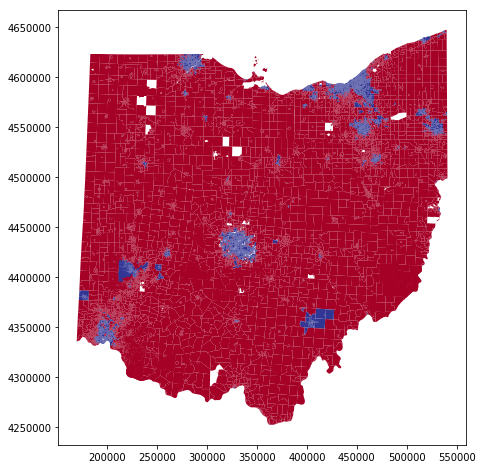

In [403]:
# plot ACTUAL winners
df_merged.plot(column='winner_binary', figsize=[8,8], cmap='RdYlBu')

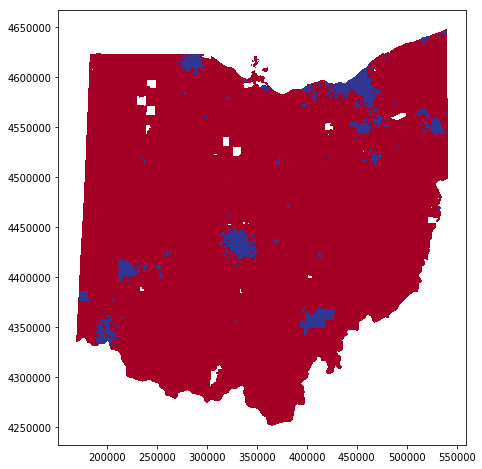

In [406]:
# plot ACTUAL winners
df_merged.plot(column='winner_binary', figsize=[8,8], antialiased=False, cmap='RdYlBu')

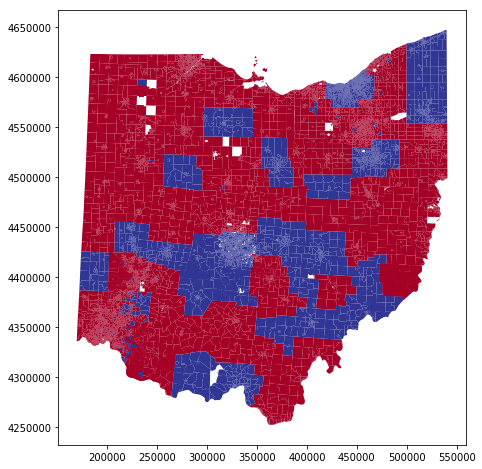

In [404]:
# plot clusters
df_merged.plot(column='cluster', figsize=[8,8], cmap='RdYlBu')

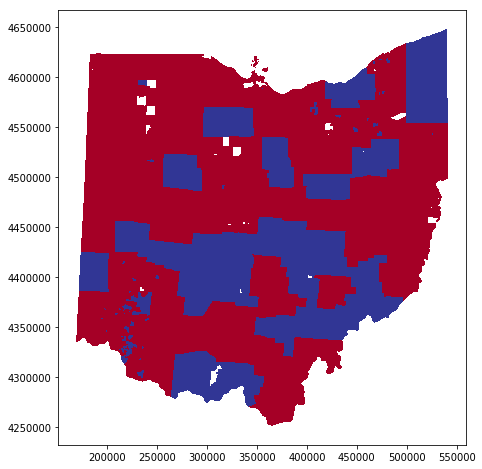

In [405]:
# plot clusters
df_merged.plot(column='cluster', figsize=[8,8], antialiased=False, cmap='RdYlBu')

# Investigate cluster characteristics

In [407]:
# function that sorts most common venues for each precinct
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [408]:
# MAY NEED TO RECREATE WILL ALL Precinct_ID's...
print(precinct_grouped.shape)
precinct_grouped.head()

(7753, 467)


,Precinct_ID,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Ph

In [471]:
# del precinct_venues_sorted

In [472]:
# create dataframe using this function
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Precinct_ID']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
precinct_venues_sorted = pd.DataFrame(columns=columns)
precinct_venues_sorted['Precinct_ID'] = precinct_grouped['Precinct_ID']

for ind in np.arange(precinct_grouped.shape[0]):
    precinct_venues_sorted.iloc[ind, 1:] = return_most_common_venues(precinct_grouped.iloc[ind, :], num_top_venues)

In [ ]:
# check
print(precinct_venues_sorted.shape)
precinct_venues_sorted.head()

In [475]:
# for precincts w/ <10 venues, change appropriate columns to 'None'
nv = precinct_grouped.shape[1]-1
print(nv)
precinct_grouped.iloc[0, 1:].value_counts()
nnonzero = nv-precinct_grouped.iloc[0, 1:].value_counts()[0]
print(nnonzero)

466
4


In [476]:
# total number of categories
nv = precinct_grouped.shape[1]-1

# loop over all precincts
for ind in range(0,precinct_venues_sorted.shape[0]):
    
    # calculate number of venues in this precinct (assumes zero-value is most common)
    nnonzero = nv-precinct_grouped.iloc[ind, 1:].value_counts()[0]
    
    # check if there are less than 10 venues in the precinct
    if (nnonzero<10):
        for inv in range(nnonzero+1,num_top_venues+1):
            precinct_venues_sorted.iloc[ind, inv] = 'None'

In [477]:
# check
print(precinct_venues_sorted.shape)
precinct_venues_sorted.head()

(7753, 11)


,Precinct_ID,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,0,Gas Station,Market,Bar,Italian Restaurant,None,None,None,None,None,None
1,1,Comfort Food Restaurant,Golf Course,Restaurant,None,None,None,None,None,None,None
2,12,Ice Cream Shop,Park,Discount Store,None,None,None,None,None,None,None
3,20,Gastropub,None,None,None,None,None,None,None,None,None
4,22,Latin American Restaurant,None,None,None,None,None,None,None,None,None


In [478]:
# NEED A DF merging 'precinct_venues_sorted' df and 'cluster' COLUMN ...
precinct_sorted_cluster_inner = df_merged.merge(precinct_venues_sorted, how='inner', on='Precinct_ID')

In [479]:
print(precinct_sorted_cluster_inner.shape)
precinct_sorted_cluster_inner.head()

(7753, 521)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [480]:
# NEED A DF merging 'precinct_venues_sorted' df and 'cluster' COLUMN ...
precinct_sorted_cluster_outer = df_merged.merge(precinct_venues_sorted, how='outer', on='Precinct_ID')

In [481]:
print(precinct_sorted_cluster_outer.shape)
precinct_sorted_cluster_outer.head()

(10295, 521)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [482]:
# assign value of zero to all NaN values in one-hot section of df_merged
precinct_sorted_cluster_outer.fillna('None', inplace=True)

In [483]:
print(precinct_sorted_cluster_outer.shape)
precinct_sorted_cluster_outer.head()

(10295, 521)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [486]:
kclusters

2

In [487]:
precinct_sorted_cluster_inner.iloc[0,520]

'None'

In [488]:
precinct_sorted_cluster_inner.iloc[0,511]

'Gas Station'

In [489]:
# initialize list of cluster labels
prlabels = []

# loop of number of clusters
for ik in range(0,kclusters):
    print(ik)
    # create series/dataframe of '1st Most Common Venue'
    prk = precinct_sorted_cluster_inner.loc[precinct_sorted_cluster_inner['cluster'] == ik, precinct_sorted_cluster_inner.columns[list(range(511,521))]]
    # count unique occurences
    prcounts = prk.iloc[:,0].value_counts()
    print(prcounts)
    # identify #1 most common venue 
    prlabels.append(prcounts.index[0])
    #print(tmlabels[ik-1])

#print(prlabels)


0
Park                                        330
Construction & Landscaping                  206
Pizza Place                                 168
Bar                                         154
Convenience Store                           141
Fast Food Restaurant                        137
Ice Cream Shop                              117
Grocery Store                                97
Food                                         86
American Restaurant                          83
Trail                                        78
Gym                                          76
Gas Station                                  72
Playground                                   69
Discount Store                               59
Baseball Field                               57
Gym / Fitness Center                         56
Bakery                                       54
Home Service                                 52
Bank                                         51
Business Service                      

In [560]:
precinct_sorted_cluster_inner[precinct_sorted_cluster_inner['cluster'] == 1].head(100)

,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

### re-create one-hot df but don't take mean, leave as ones and zeros...

In [447]:
# combine each unique neighborhood into a single row ==> take average of one-hot values
precinct_groupraw = precinct_onehot.groupby('Precinct_ID').sum().reset_index()

In [448]:
print(precinct_groupraw.shape)
precinct_groupraw.head()

(7753, 467)


,Precinct_ID,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Ph

In [449]:
print(np.sum(precinct_groupraw.iloc[0,1:]))

4


In [450]:
print(np.sum(precinct_groupraw.iloc[1,1:]))

3


In [452]:
# merge based on the index of each dataframe
# not all precincts are present in 'precinct_grouped', so others will be filled in w/ zeros
df_mergedraw = ohio_df.merge(precinct_groupraw, how='outer', on='Precinct_ID')

In [454]:
print(df_mergedraw.shape)
df_mergedraw.head()

(10295, 509)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

In [ ]:
# # find column indices for one-hot section of new df
# j_start = df_merged.columns.get_loc("ATM")
# j_end = df_merged.columns.get_loc("Zoo Exhibit")
# print(j_start,j_end)

In [455]:
# assign value of zero to all NaN values in one-hot section of df_merged
df_mergedraw.fillna(0, inplace=True)

In [456]:
print(df_mergedraw.shape)
df_mergedraw.head()

(10295, 509)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

In [458]:
df_mergedraw.iloc[0:5,j_start:j_end+1]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

1    9809
0     486
Name: cluster, dtype: int64


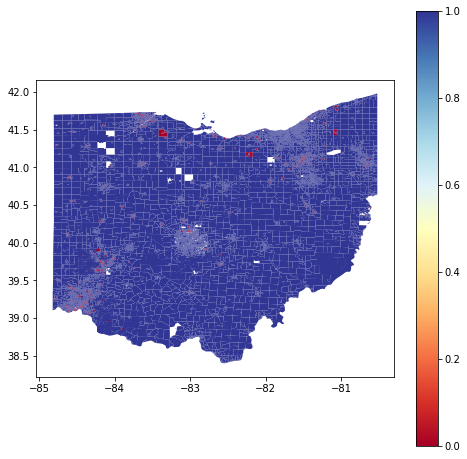

In [485]:
# # make copy 
# df_mergedXXX = df_merged

# set number of clusters
kclusters = 2

# isolate one-hot section of df_merged
oh_clustraw = df_mergedraw.iloc[:,j_start:j_end+1]

# run k-means clustering
kmeansraw = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clustraw)

# overwrite cluster label column
df_mergedraw["cluster"] = kmeansraw.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_mergedraw["cluster"].value_counts())

# plot clusters
df_mergedraw.plot(column='cluster', figsize=[8,8], cmap='RdYlBu', legend=True)

# Clustering: K-Means (k=3, all precincts)

In [140]:
# make copy 
df_merged3 = df_merged

In [142]:
print(df_merged3.shape)
df_merged3.head()

(10295, 511)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [181]:
# find column indices for one-hot section of new df
j_start3 = df_merged3.columns.get_loc("ATM")
j_end3 = df_merged3.columns.get_loc("Zoo Exhibit")
print(j_start3,j_end3)

44 509


In [183]:
print(j_start,j_end)

43 508


In [182]:
df_merged3.iloc[0:5,j_start+1:j_end+2]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [185]:
df_merged3.iloc[0:5,j_start3:j_end3+1]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [164]:
# set number of clusters
kclusters = 3

# isolate one-hot section of df_merged
oh_clust3 = df_merged3.iloc[:,j_start3:j_end3+1]

# run k-means clustering
kmeans3 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clust3)

# check cluster labels generated for each row in the dataframe
kmeans3.labels_

array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

In [165]:
# overwrite cluster label column
df_merged3["cluster"] = kmeans3.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

In [166]:
print(df_merged3.shape)
df_merged3.head()

(10295, 511)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [167]:
df_merged3["cluster"].value_counts()

2    6328
1    3639
0     328
Name: cluster, dtype: int64

In [168]:
df_merged3["winner_binary"].value_counts()

0    7163
1    3132
Name: winner_binary, dtype: int64

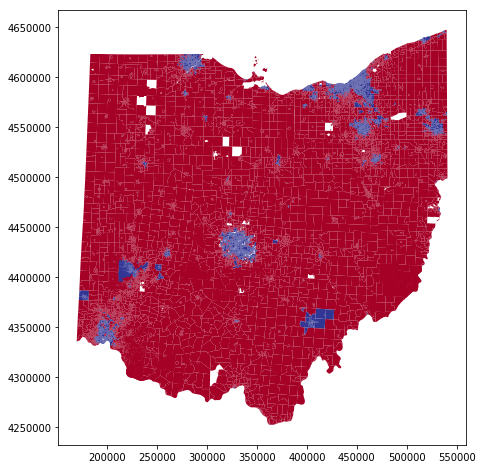

In [169]:
# plot ACTUAL winners
df_merged3.plot(column='winner_binary', figsize=[8,8], cmap='RdYlBu')

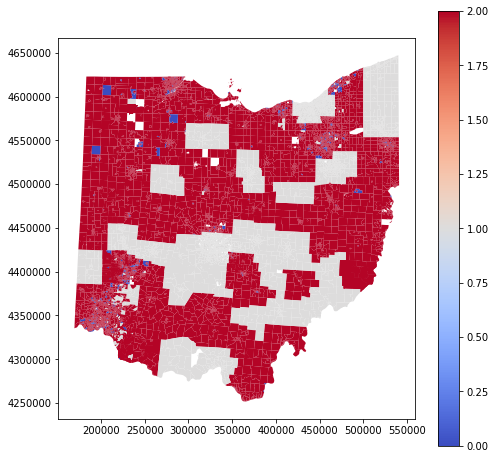

In [172]:
# plot clusters
df_merged3.plot(column='cluster', figsize=[8,8], cmap='coolwarm', legend=True)

# Clustering: K-Means (k=4, all precincts)

2    5947
1    3637
3     401
0     310
Name: cluster, dtype: int64


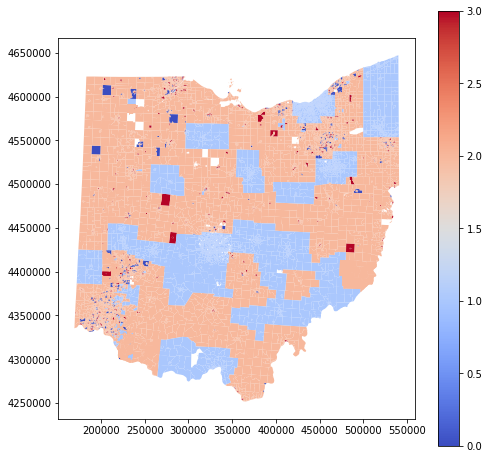

In [186]:
# make copy 
df_merged4 = df_merged

# set number of clusters
kclusters = 4

# isolate one-hot section of df_merged
oh_clust4 = df_merged4.iloc[:,j_start3:j_end3+1]

# run k-means clustering
kmeans4 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clust4)

# overwrite cluster label column
df_merged4["cluster"] = kmeans4.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_merged4["cluster"].value_counts())

# plot clusters
df_merged4.plot(column='cluster', figsize=[8,8], cmap='coolwarm', legend=True)

# Clustering: K-Means (k=5, all precincts)

1    6327
0    3639
2     217
4     101
3      11
Name: cluster, dtype: int64


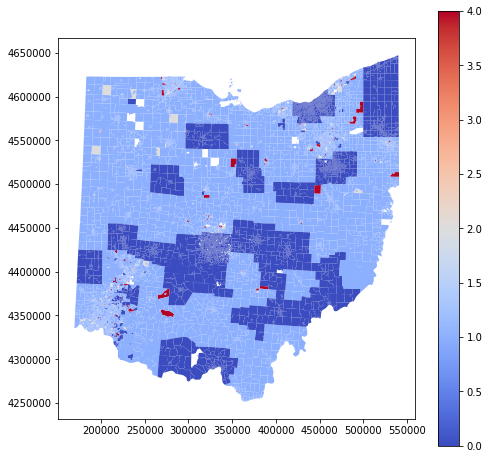

In [187]:
# make copy 
df_merged5 = df_merged

# set number of clusters
kclusters = 5

# isolate one-hot section of df_merged
oh_clust5 = df_merged5.iloc[:,j_start3:j_end3+1]

# run k-means clustering
kmeans5 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clust5)

# overwrite cluster label column
df_merged5["cluster"] = kmeans5.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_merged5["cluster"].value_counts())

# plot clusters
df_merged5.plot(column='cluster', figsize=[8,8], cmap='coolwarm', legend=True)

# Clustering: K-Means (k=10, all precincts)

0    5906
1    3624
3     198
6     132
2      98
7      96
5      72
4      57
9      57
8      55
Name: cluster, dtype: int64


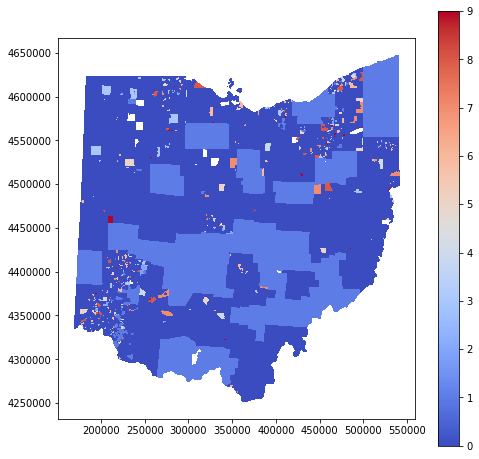

In [195]:
# make copy 
df_merged10 = df_merged

# set number of clusters
kclusters = 10

# isolate one-hot section of df_merged
oh_clust10 = df_merged10.iloc[:,j_start3:j_end3+1]

# run k-means clustering
kmeans10 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_clust10)

# overwrite cluster label column
df_merged10["cluster"] = kmeans10.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_merged10["cluster"].value_counts())

# plot clusters
df_merged10.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# Clustering: K-Means (k=2->10, ONLY use features that are "food" venues)

In [332]:
# make copy 
df_food = df_merged

In [333]:
print(df_food.shape)
df_food.head()

(10295, 511)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [374]:
print(df_food.iloc[:,j_start3:j_end3+1].shape)
df_food.iloc[0:5,j_start3:j_end3+1]

(10295, 466)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [340]:
colNames = df_food.columns[df_food.columns.str.contains(pat = 'ATM|Adult')]
print(type(colNames))
colNames

<class 'pandas.core.indexes.base.Index'>


Index(['ATM', 'Adult Boutique', 'Adult Education Center'], dtype='object')

In [339]:
df_test = df_food[colNames]
df_test.head()

,ATM,Adult Boutique,Adult Education Center
0,0.0,0.0,0.0
1,0.0,0.0,0.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0


In [359]:
colStr = ["ATM|Adult"]
colStr

['ATM|Adult']

In [361]:
df_test2 = df_food[colStr]
df_test2.head()

KeyError: "None of [Index(['ATM|Adult'], dtype='object')] are in the [columns]"

In [344]:
df_food.iloc[0:1,j_start3:j_end3+1].columns

Index(['ATM', 'Accessories Store', 'Adult Boutique', 'Adult Education Center',
       'Advertising Agency', 'African Restaurant', 'Airport',
       'Airport Service', 'Airport Terminal', 'American Restaurant',
       ...
       'Weight Loss Center', 'Whisky Bar', 'Wine Bar', 'Wine Shop', 'Winery',
       'Wings Joint', 'Women's Store', 'Yoga Studio', 'Zoo', 'Zoo Exhibit'],
      dtype='object', length=466)

In [346]:
df_food.iloc[0:1,j_start3:j_end3+1].head(1)

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [357]:
# manually generate string only containing column names pertaining to food
foodStr = ["Restaurant|BBQ|Bagel|Bakery|Breakfast|Bistro|Tea|Bar|Beer|Brewery|Buffet|Burger|"
           "Burrito|Butcher|Cafeteria|Café\|Cafe|Candy|Cheese|Chocolate|Coffee|Convenience"
           "Cupcake|Deli|Bodega|Dessert|Dim Sum|Diner|Donut|Farm|Market|Fast Food|Fish|"
           "Food|Drink|Chicken|Yogurt|Fruit|Vegetable|Gastropub|Gourmet|Grocery|Hot Dog|"
           "Ice Cream|Pub|Juice|Liquor|Noodle|Pie|Pizza|Poke|Salad|Sandwich|Smoothie|Snack|"
           "Soup|Speakeasy|Steakhouse|Supermarket|Taco|Vineyard|Wine|Winery|Wings"]
foodStr

['Restaurant|BBQ|Bagel|Bakery|Breakfast|Bistro|Tea|Bar|Beer|Brewery|Buffet|Burger|Burrito|Butcher|Cafeteria|Café\\|Cafe|Candy|Cheese|Chocolate|Coffee|ConvenienceCupcake|Deli|Bodega|Dessert|Dim Sum|Diner|Donut|Farm|Market|Fast Food|Fish|Food|Drink|Chicken|Yogurt|Fruit|Vegetable|Gastropub|Gourmet|Grocery|Hot Dog|Ice Cream|Pub|Juice|Liquor|Noodle|Pie|Pizza|Poke|Salad|Sandwich|Smoothie|Snack|Soup|Speakeasy|Steakhouse|Supermarket|Taco|Vineyard|Wine|Winery|Wings']

In [363]:
colNames = df_food.columns[df_food.columns.str.contains(pat = "Restaurant|BBQ|Bagel|Bakery|Breakfast|Bistro|Tea|Bar|Beer|Brewery|Buffet|Burger|"
           "Burrito|Butcher|Cafeteria|Café\|Cafe|Candy|Cheese|Chocolate|Coffee|Convenience"
           "Cupcake|Deli|Bodega|Dessert|Dim Sum|Diner|Donut|Farm|Market|Fast Food|Fish|"
           "Food|Drink|Chicken|Yogurt|Fruit|Vegetable|Gastropub|Gourmet|Grocery|Hot Dog|"
           "Ice Cream|Pub|Juice|Liquor|Noodle|Pie|Pizza|Poke|Salad|Sandwich|Smoothie|Snack|"
           "Soup|Speakeasy|Steakhouse|Supermarket|Taco|Vineyard|Wine|Winery|Wings")]
colNames

Index(['African Restaurant', 'American Restaurant', 'Arepa Restaurant',
       'Argentinian Restaurant', 'Asian Restaurant', 'Australian Restaurant',
       'BBQ Joint', 'Bagel Shop', 'Bakery', 'Bar',
       ...
       'Theme Restaurant', 'Tibetan Restaurant',
       'Vegetarian / Vegan Restaurant', 'Vietnamese Restaurant', 'Vineyard',
       'Whisky Bar', 'Wine Bar', 'Wine Shop', 'Winery', 'Wings Joint'],
      dtype='object', length=137)

In [368]:
food_onehot = df_food[colNames]
print(food_onehot.shape)
food_onehot.head()

(10295, 137)


,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bistro,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Butcher,Cafeteria,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Cocktail Bar,Coffee Shop,College Cafeteria,Comfort Food Restaurant,Cuban Restaurant,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Donut Shop,Dutch Restaurant,Eastern European Restaurant,Ethiopian Restaurant,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Gastropub,Gay Bar,German Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Halal Restaurant,Health Food Store,Himalayan Restaurant,Hookah Bar,Hot Dog Joint,Hotel Bar,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Market,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,New American Restaurant,Night Market,Noodle House,North Indian Restaurant,Organic Grocery,Peruvian Restaurant,Pie Shop,Pizza Place,Poke Place,Pub,Public Art,Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Smoothie Shop,Snack Place,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Speakeasy,Sports Bar,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Vineyard,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

0    9174
4     298
8     295
6     211
9      80
1      65
2      53
3      52
7      46
5      21
Name: cluster, dtype: int64


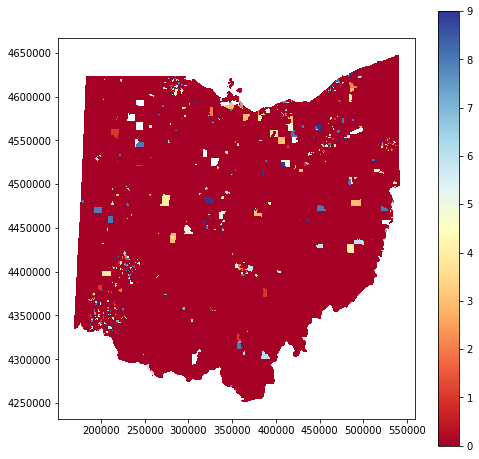

In [373]:
# set number of clusters
kclusters = 10

# run k-means clustering
km_food = KMeans(n_clusters=kclusters, random_state=0).fit(food_onehot)

# overwrite cluster label column
df_food["cluster"] = km_food.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_food["cluster"].value_counts())

# plot clusters
df_food.plot(column='cluster', figsize=[8,8], cmap='RdYlBu', antialiased=False, legend=True)

# Clustering: K-Means (k=2, ONLY precincts w/ venues)

Now, what if, instead of assigning zeros to all the one-hot features for precincts WITHOUT venues (as above), what if those were assumed to Republican, and the k-means clustering was only applied to precincts WITH venues. Because it looks like perhaps precincts w/o venues were clustered together, and precincts w/ venues were clustered together.

In [199]:
# merge based on the index of each dataframe
# not all precincts are present in 'precinct_grouped', so others will be filled in w/ zeros
df_inner = ohio_df.merge(precinct_grouped, how='inner', on='Precinct_ID')

In [200]:
# convert back to original CRS
df_inner = df_inner.to_crs(epsg=2958)

In [201]:
print(df_inner.shape)
df_inner.head()

(7753, 509)


,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Fi

In [204]:
df_inner.iloc[0:5,j_start:j_end+1]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [205]:
# set number of clusters
kclusters = 2

# isolate one-hot section of df_inner
oh_inner = df_inner.iloc[:,j_start:j_end+1]

# run k-means clustering
k_inner = KMeans(n_clusters=kclusters, random_state=0).fit(oh_inner)

# check cluster labels generated for each row in the dataframe
k_inner.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [206]:
# add column for cluster labels
df_inner.insert(0, 'cluster', k_inner.labels_)

In [207]:
print(df_inner.shape)
df_inner.head()

(7753, 510)


,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [208]:
df_inner["cluster"].unique()

array([0, 1])

In [209]:
df_inner["cluster"].value_counts()

0    4113
1    3640
Name: cluster, dtype: int64

In [210]:
df_inner["winner_binary"].value_counts()

0    4810
1    2943
Name: winner_binary, dtype: int64

In [211]:
# predict_inner = np.where(df_inner["cluster"]==df_inner["winner_binary"], True, False)
# type(predict_inner)

In [212]:
df_inner["predictions"] = np.where(df_inner["cluster"]==df_inner["winner_binary"], True, False)

In [213]:
df_inner["predictions"].value_counts()

True     4550
False    3203
Name: predictions, dtype: int64

In [214]:
pred_inner_perc = 100.0 * df_inner["predictions"].value_counts()[1] / (sum(df_inner["predictions"].value_counts()))
print("K-means accurate predictions: {} %".format(pred_inner_perc))

K-means accurate predictions: 58.68695988649555 %


In [215]:
10295-7753

2542

In [216]:
100.0 * (df_inner["predictions"].value_counts()[1]+2542) / (2542+sum(df_inner["predictions"].value_counts()))                                                  

68.8878096163186

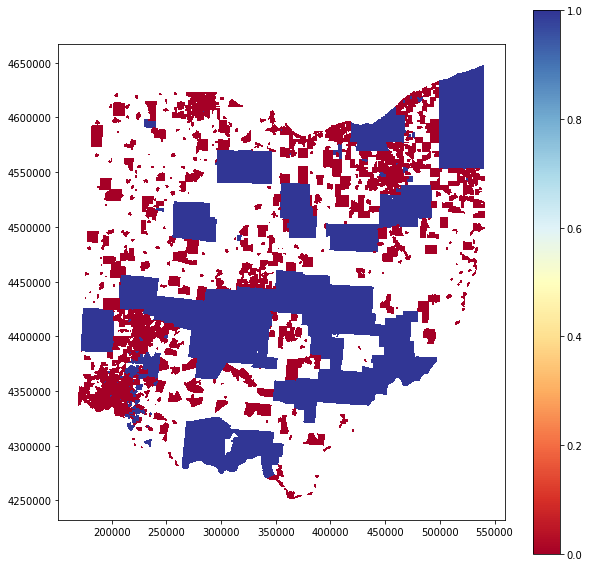

In [220]:
# plot clusters
#df_inner.plot(column='cluster', figsize=[8,8], cmap='coolwarm', legend=True)
df_inner.plot(column='cluster', 
              figsize=[10,10], 
              cmap='RdYlBu', 
              antialiased=False, 
              legend=True)

In [218]:
df_inner.iloc[0:5,j_start+1:j_end+2]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

# Clustering: K-Means (k=3, ONLY precincts w/ venues)

1    3786
0    3639
2     328
Name: cluster, dtype: int64


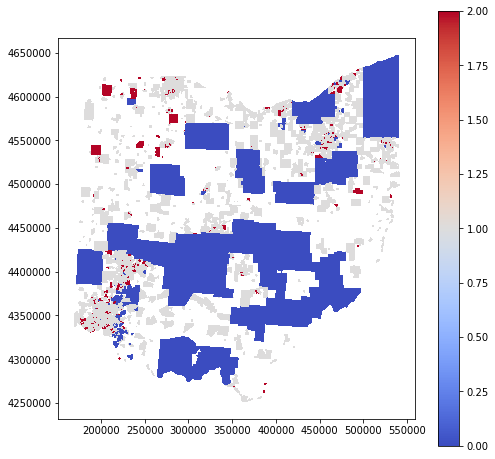

In [221]:
# make copy 
df_inner3 = df_inner

# set number of clusters
kclusters = 3

# isolate one-hot section of df_merged
oh_inner3 = df_inner3.iloc[:,j_start+1:j_end+2]

# run k-means clustering
k_inner3 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_inner3)

# overwrite cluster label column
df_inner3["cluster"] = k_inner3.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_inner3["cluster"].value_counts())

# plot clusters
df_inner3.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# Clustering: K-Means (k=5, ONLY precincts w/ venues)

1    3639
2    3572
3     328
4     143
0      71
Name: cluster, dtype: int64


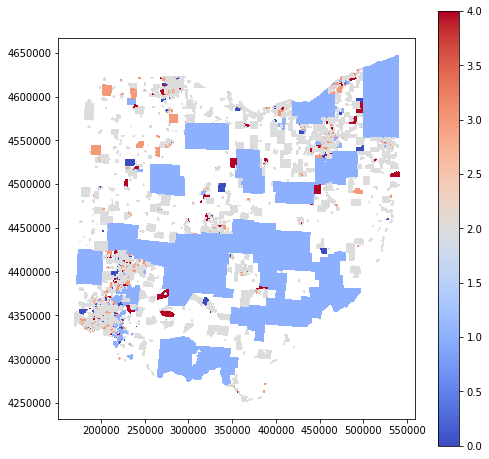

In [222]:
# make copy 
df_inner5 = df_inner

# set number of clusters
kclusters = 5

# isolate one-hot section of df_merged
oh_inner5 = df_inner5.iloc[:,j_start+1:j_end+2]

# run k-means clustering
k_inner5 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_inner5)

# overwrite cluster label column
df_inner5["cluster"] = k_inner5.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_inner5["cluster"].value_counts())

# plot clusters
df_inner5.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# Clustering: K-Means (k=10, ONLY precincts w/ venues)

1    3637
8    2627
4     397
5     212
7     200
3     191
2     152
6     142
0     127
9      68
Name: cluster, dtype: int64


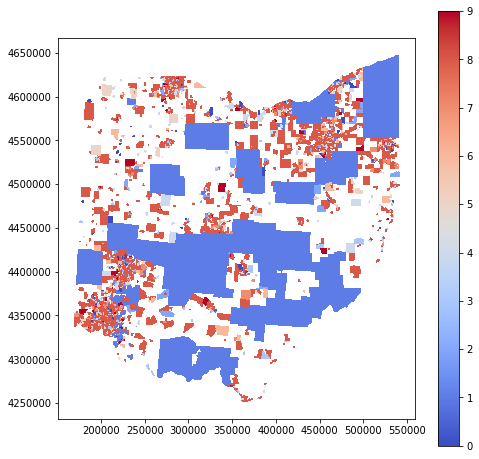

In [225]:
# make copy 
df_inner10 = df_inner

# set number of clusters
kclusters = 10

# isolate one-hot section of df_merged
oh_inner10 = df_inner10.iloc[:,j_start+1:j_end+2]

# run k-means clustering
k_inner10 = KMeans(n_clusters=kclusters, random_state=0).fit(oh_inner10)

# overwrite cluster label column
df_inner10["cluster"] = k_inner10.labels_
#df_merged.insert(0, 'cluster', kmeans.labels_)

print(df_inner10["cluster"].value_counts())

# plot clusters
df_inner10.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# DBSCAN Clustering

In [242]:
# copy original merged dataframe
df_dbscan = df_merged

In [243]:
# isolate the one-hot features from original dataframe containing all precincts
df_dbscan.iloc[0:5,j_start+1:j_end+2]

,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [230]:
df_onehot = df_dbscan.iloc[:,j_start+1:j_end+2]

In [231]:
print(df_onehot.shape)
df_onehot.head()

(10295, 466)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

Choosing an optimal epsilon (threshold distance to qualify as neighbor points in same cluster) value...

In [232]:
from sklearn.neighbors import NearestNeighbors

In [233]:
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(df_onehot)
distances, indices = nbrs.kneighbors(df_onehot)

In [237]:
print(len(distances))
distances

10295


array([[0.        , 0.44845413, 0.45276926, 0.45363235, 0.45643546],
       [0.        , 0.46188022, 0.47140452, 0.51639778, 0.56568542],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       ...,
       [0.        , 0.47140452, 0.47140452, 0.47140452, 0.47140452],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

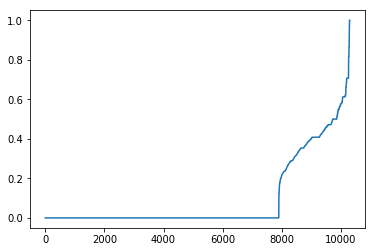

In [238]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Set eps=0.4, since this is where the distances have an inflection point. Many precincts don't have venues, thus the nearly 8000 values of 0.0.

In [239]:
from sklearn.cluster import DBSCAN

In [240]:
m = DBSCAN(eps=0.4, min_samples=5).fit(df_onehot)

In [241]:
m.labels_

array([-1, -1,  0, ..., -1,  0,  0])

In [245]:
# overwrite cluster labels column
df_dbscan["cluster"] = m.labels_
#df_dbscan.insert(0, 'cluster', m.labels_)

 0     3717
 22    3621
-1     1918
 1       76
 3       50
 11      45
 15      40
 31      33
 23      31
 30      29
 19      28
 32      25
 27      24
 18      23
 34      22
 10      21
 24      21
 21      21
 35      19
 54      18
 9       18
 55      17
 14      17
 5       17
 72      14
 40      14
 6       14
 46      13
 51      13
 43      12
 12      11
 39      11
 8       11
 29      11
 37      11
 41      10
 25       9
 47       9
 64       9
 7        9
 36       9
 69       8
 17       8
 16       8
 49       8
 76       8
 26       7
 13       7
 44       7
 71       7
 75       7
 52       7
 56       7
 70       7
 62       6
 38       6
 82       6
 42       6
 53       6
 63       6
 28       6
 73       6
 80       5
 48       5
 33       5
 79       5
 57       5
 65       5
 78       5
 77       5
 61       5
 45       5
 68       5
 60       5
 20       5
 4        5
 59       5
 74       5
 66       5
 58       5
 50       5
 2        5
 81       5
 67 

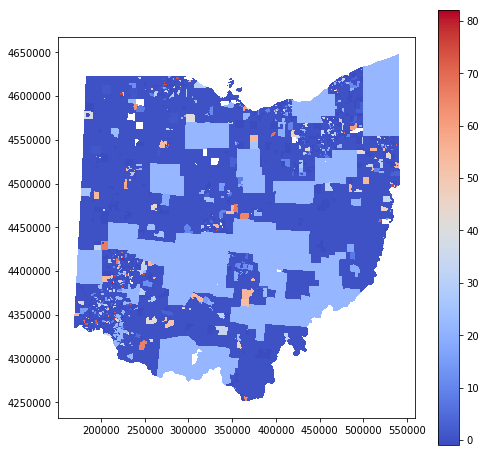

In [246]:
print(df_dbscan["cluster"].value_counts())

# plot clusters
df_dbscan.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

 3    3621
 0    3519
-1    3029
 1      76
 2      50
Name: cluster, dtype: int64


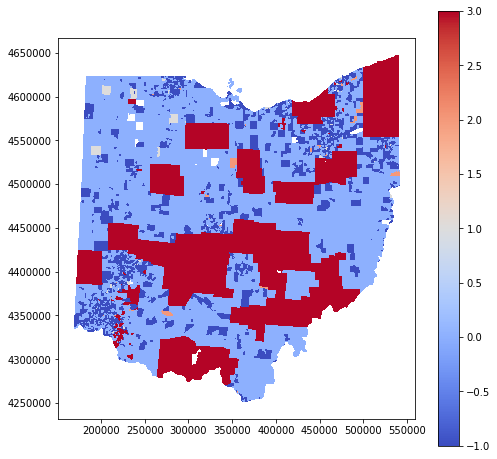

In [247]:
# copy original merged dataframe
df_dbscan50 = df_merged

# run (use same one-hot df)
m50 = DBSCAN(eps=0.4, min_samples=50).fit(df_onehot)

# overwrite cluster labels column
df_dbscan50["cluster"] = m50.labels_

print(df_dbscan50["cluster"].value_counts())

# plot clusters
df_dbscan50.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# Hierarchical Clustering - Agglomerative

In [248]:
from sklearn.cluster import AgglomerativeClustering 

0    10282
2        3
1        3
7        1
6        1
5        1
4        1
3        1
9        1
8        1
Name: cluster, dtype: int64


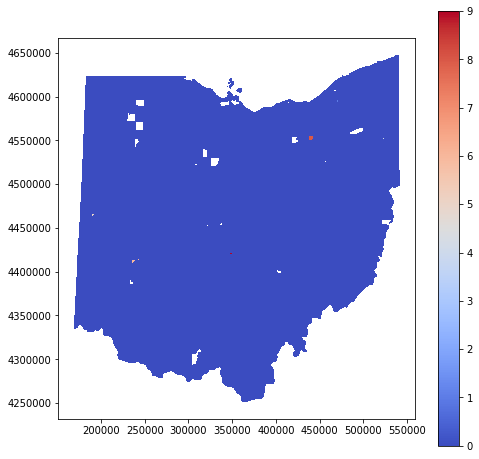

In [251]:
# copy original merged dataframe
df_agg = df_merged

# run (use same one-hot df)
agglom = AgglomerativeClustering(n_clusters = 10, linkage = 'average').fit(df_onehot)

# overwrite cluster labels column
df_agg["cluster"] = agglom.labels_

print(df_agg["cluster"].value_counts())

# plot clusters
df_agg.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

In [252]:
from scipy.spatial import distance_matrix 

In [253]:
dist_matrix = distance_matrix(df_onehot,df_onehot) 
print(type(dist_matrix))

<class 'numpy.ndarray'>


In [254]:
agglom_dist = AgglomerativeClustering(n_clusters = 2, linkage = 'complete')
agglom_dist.fit(dist_matrix)

/anaconda3/lib/python3.7/site-packages/sklearn/cluster/hierarchical.py:471: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='complete', memory=None,
            n_clusters=2, pooling_func='deprecated')

0    6674
1    3621
Name: cluster, dtype: int64


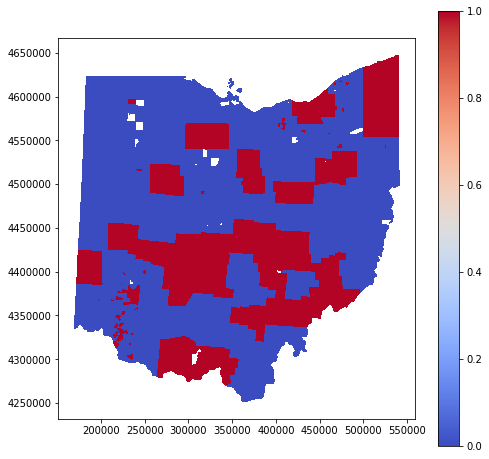

In [255]:
# copy original merged dataframe
df_agg_dist = df_merged

# overwrite cluster labels column
df_agg_dist["cluster"] = agglom_dist.labels_

print(df_agg_dist["cluster"].value_counts())

# plot clusters
df_agg_dist.plot(column='cluster', 
                 figsize=[8,8], 
                 cmap='coolwarm', 
                 antialiased=False, 
                 legend=True)

# Classification: set up

In [258]:
print(type(df_onehot))
print(df_onehot.shape)
df_onehot.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
(10295, 466)


,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,Hunting Supply,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mob

In [262]:
print(type(df_onehot.values))
print(df_onehot.values.shape)
df_onehot.values

<class 'numpy.ndarray'>
(10295, 466)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [283]:
X = df_onehot.values

In [264]:
df_merged.head()

,cluster,Precinct_ID,PRECINCT,COUNTY,global_id,COUNTYGEOID10,PRECINCT_election_results,PRECINCTCODE_election_results,PRECINCT_misfit,county_name,precinct_code,region_name,media_market,pres_16_registered_voters,pres_16_total_voters,pres_16_turnout_percentage,pres_16_james_jerome_bell_wi,pres_16_michael_bickelmeyer_wi,pres_16_darrell_l_castle_wi,pres_16_hillary_clinton_d,pres_16_richard_duncan,pres_16_cherunda_fox_wi,pres_16_ben_hartnell_wi,pres_16_tom_hoefling_wi,pres_16_bruce_e_jaynes_wi,pres_16_gary_johnson,pres_16_chris_keniston_wi,pres_16_barry_kirschner_wi,pres_16_laurence_kotlikoff_wi,pres_16_joseph_maldonado_wi,pres_16_michael_andrew_maturen_wi,pres_16_evan_mc_mullin_wi,pres_16_monica_moorehead_wi,pres_16_joe_schriner_wi,pres_16_mike_smith_wi,pres_16_jill_stein_g,pres_16_josiah_r_stroh_wi,pres_16_douglas_w_thomson_wi,pres_16_donald_j_trump_r,geometry,centroid_lon,centroid_lat,winner,winner_binary,ATM,Accessories Store,Adult Boutique,Adult Education Center,Advertising Agency,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Carpet Store,Casino,Castle,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Cafeteria,College Football Field,College Gym,College Hockey Rink,College Quad,College Residence Hall,College Science Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,H

In [284]:
y = df_merged["winner"]

In [266]:
from sklearn.model_selection import train_test_split

In [290]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=3)

In [292]:
print(X_train.shape)
print(y_train.shape)

(7206, 466)
(7206,)


In [293]:
print(X_test.shape)
print(y_test.shape)

(3089, 466)
(3089,)


# Classification: Decision Tree

In [282]:
from sklearn.tree import DecisionTreeClassifier

In [270]:
precinctTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
#precinctTree # show the default parameters

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [271]:
precinctTree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [272]:
predTree = precinctTree.predict(X_test)

In [281]:
print(type(predTree))
print(len(predTree))
np.unique(predTree)

<class 'numpy.ndarray'>
3089


array(['pres_16_donald_j_trump_r', 'pres_16_hillary_clinton_d'],
      dtype=object)

In [273]:
from sklearn import metrics
#import matplotlib.pyplot as plt
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, predTree))

DecisionTrees's Accuracy:  0.6943994820330204


#### Decision Tree: Optimization of Parameters

In [288]:
# Create list of DecisionTreeClassifier 'criterion' parameter
critval = ['gini', 'entropy']
ncrit = len(critval)
print('ncrit =',ncrit)
for ic, crit in enumerate(critval):
    print(ic, crit)

ncrit = 2
0 gini
1 entropy


In [305]:
# Allocate arrays for mean and standard deviation for each 'criterion' value
mean_acc = np.zeros((ncrit))
std_acc = np.zeros((ncrit))
 
# Loop over 'criterion' options
for ic, crit in enumerate(critval):
        
    # Train Model and Predict  
    precinctTree = DecisionTreeClassifier(criterion=crit, max_depth=4)
    precinctTree.fit(X_train,y_train)
    predTree = precinctTree.predict(X_test)
    
    # Calculate mean accuracy score and standard deviation
    mean_acc[ic] = metrics.accuracy_score(y_test, predTree)
    std_acc[ic] = np.std(predTree==y_test)/np.sqrt(predTree.shape[0])
    print(ic, crit, mean_acc[ic], std_acc[ic])

# print(mean_acc.shape)
# mean_acc

0 gini 0.6943994820330204 0.008288439713609689
1 entropy 0.6943994820330204 0.008288439713609689


In [297]:
# Import and calculate Jaccard Similarity Score
from sklearn.metrics import jaccard_similarity_score

In [298]:
# Jaccard Similarity Score
jaccard_similarity_score(y_test, predTree)

0.6943994820330204

In [299]:
# Import f1-score
from sklearn.metrics import classification_report

In [301]:
# f1-score
print (classification_report(y_test, predTree))

                           precision    recall  f1-score   support

 pres_16_donald_j_trump_r       0.70      0.98      0.82      2162
pres_16_hillary_clinton_d       0.38      0.03      0.05       927

                micro avg       0.69      0.69      0.69      3089
                macro avg       0.54      0.50      0.44      3089
             weighted avg       0.61      0.69      0.59      3089



# Classification: K-Nearest Neighbors

In [302]:
# Import KNN
from sklearn.neighbors import KNeighborsClassifier

In [306]:
# k-values to test...
Ks = 20
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))

# Loop over k-values
for n in range(1,Ks):
    
    # Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat_KNN = neigh.predict(X_test)
    
    # Calculate mean accuracy score and standard deviation    
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat_KNN)
    std_acc[n-1]=np.std(yhat_KNN==y_test)/np.sqrt(yhat_KNN.shape[0])

print(mean_acc.shape)
mean_acc

(19,)


array([0.66202655, 0.68760117, 0.66720622, 0.68436387, 0.67109097,
       0.68954354, 0.68047912, 0.68339268, 0.67788928, 0.6824215 ,
       0.67788928, 0.68274522, 0.67659437, 0.67853674, 0.6736808 ,
       0.68112658, 0.67724183, 0.68080285, 0.66364519])

In [307]:
print(mean_acc.max())
print(mean_acc.argmax())

0.689543541599223
5


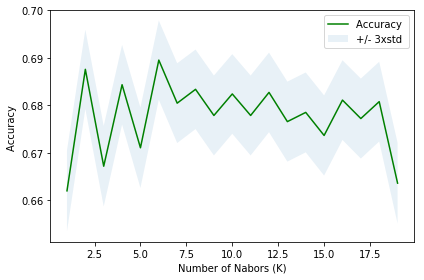

In [308]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Nabors (K)')
plt.tight_layout()
plt.show()

In [309]:
# Regenerate KNN with best k
k = mean_acc.argmax() + 1 # add 1 to account for indexing starting at 0, not 1
print(k)
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh

6


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=6, p=2,
           weights='uniform')

In [310]:
print("Train set Accuracy: ", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat_KNN))

Train set Accuracy:  0.7198168193172356
Test set Accuracy:  0.6636451926189706


In [311]:
jaccard_similarity_score(y_test, yhat_KNN)

0.6636451926189706

In [312]:
print (classification_report(y_test, yhat_KNN))

                           precision    recall  f1-score   support

 pres_16_donald_j_trump_r       0.81      0.68      0.74      2162
pres_16_hillary_clinton_d       0.46      0.63      0.53       927

                micro avg       0.66      0.66      0.66      3089
                macro avg       0.63      0.65      0.63      3089
             weighted avg       0.70      0.66      0.68      3089



# Classification: SVM

In [313]:
# Import SVM
from sklearn import svm

In [314]:
# SVM has four callable 'kernel' options: ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’
# ** & 'poly' can be further modified by the 'degree' parameter (default=3)

# Create list of SVM 'kernel' parameter
kernval = ['linear', 'poly', 'rbf', 'sigmoid']
nkern = len(kernval)
print('nkern =',nkern)
for ik, kern in enumerate(kernval):
    print(ik, kern)

nkern = 4
0 linear
1 poly
2 rbf
3 sigmoid


In [315]:
# Allocate arrays for mean and standard deviation for each 'kernel' value
mean_acc = np.zeros((nkern))
std_acc = np.zeros((nkern))
 
# Loop over 'criterion' options
for ik, kern in enumerate(kernval):
        
    # Train Model and Predict  
    svm_loan = svm.SVC(kernel=kern, gamma='auto')
    svm_loan.fit(X_train, y_train)
    yhat_SVM = svm_loan.predict(X_test)
    
    # Calculate mean accuracy score and standard deviation
    mean_acc[ik] = metrics.accuracy_score(y_test, yhat_SVM)
    std_acc[ik] = np.std(yhat_SVM==y_test)/np.sqrt(yhat_SVM.shape[0])
    print(ik, kern, mean_acc[ik], std_acc[ik])

print(mean_acc.shape)
mean_acc

0 linear 0.6995791518290709 0.008248491080216865
1 poly 0.699902881191324 0.00824595289240275
2 rbf 0.699902881191324 0.00824595289240275
3 sigmoid 0.699902881191324 0.00824595289240275
(4,)


array([0.69957915, 0.69990288, 0.69990288, 0.69990288])

In [316]:
# Allocate arrays for mean and standard deviation for each 'kernel' value
mean_acc = np.zeros((nkern))
std_acc = np.zeros((nkern))

# Test different degree 'poly' kernels, not just the default degree=3...
ndegree = 10
 
# Loop over 'criterion' options
for ik, kern in enumerate(kernval):
    
    # Test 1-->ndegree different 'poly' kernels
    if (kern=='poly'):
                
        for ideg in range(1,ndegree+1):
            
            # Train Model and Predict  
            svm_loan = svm.SVC(kernel=kern, degree=ideg, gamma='auto')
            svm_loan.fit(X_train, y_train)
            yhat_SVM = svm_loan.predict(X_test)

            # Calculate mean accuracy score and standard deviation
            mean_acc[ik] = metrics.accuracy_score(y_test, yhat_SVM)
            std_acc[ik] = np.std(yhat_SVM==y_test)/np.sqrt(yhat_SVM.shape[0])
            print(ik, kern, ideg, mean_acc[ik], std_acc[ik])
        
    # Test all other non-'poly' kernels
    else:
        
        # Train Model and Predict  
        svm_loan = svm.SVC(kernel=kern, gamma='auto')
        svm_loan.fit(X_train, y_train)
        yhat_SVM = svm_loan.predict(X_test)
    
        # Calculate mean accuracy score and standard deviation
        mean_acc[ik] = metrics.accuracy_score(y_test, yhat_SVM)
        std_acc[ik] = np.std(yhat_SVM==y_test)/np.sqrt(yhat_SVM.shape[0])
        print(ik, kern, mean_acc[ik], std_acc[ik])

print(mean_acc.shape)
mean_acc

0 linear 0.6995791518290709 0.008248491080216865
1 poly 1 0.699902881191324 0.00824595289240275
1 poly 2 0.699902881191324 0.00824595289240275
1 poly 3 0.699902881191324 0.00824595289240275
1 poly 4 0.699902881191324 0.00824595289240275
1 poly 5 0.699902881191324 0.00824595289240275
1 poly 6 0.699902881191324 0.00824595289240275
1 poly 7 0.699902881191324 0.00824595289240275
1 poly 8 0.699902881191324 0.00824595289240275
1 poly 9 0.699902881191324 0.00824595289240275
1 poly 10 0.699902881191324 0.00824595289240275
2 rbf 0.699902881191324 0.00824595289240275
3 sigmoid 0.699902881191324 0.00824595289240275
(4,)


array([0.69957915, 0.69990288, 0.69990288, 0.69990288])

In [317]:
# Create SVM model
svm_loan = svm.SVC(kernel='linear', gamma='auto')

In [318]:
# Fit model to training dataset
svm_loan.fit(X_train, y_train) 

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [319]:
# Predict classification labels of test dataset
yhat_SVM = svm_loan.predict(X_test)

In [320]:
# Jaccard Similarity Score
jaccard_similarity_score(y_test, yhat_SVM)

0.6995791518290709

In [321]:
# f1-score
print (classification_report(y_test, yhat_SVM))

                           precision    recall  f1-score   support

 pres_16_donald_j_trump_r       0.70      1.00      0.82      2162
pres_16_hillary_clinton_d       0.40      0.00      0.00       927

                micro avg       0.70      0.70      0.70      3089
                macro avg       0.55      0.50      0.41      3089
             weighted avg       0.61      0.70      0.58      3089



# Classification: Logistic Regression

In [323]:
# Import LogisticRegression
from sklearn.linear_model import LogisticRegression

In [324]:
# LogisticRegression has many parameters. We will focus on regularization strength C, and solver:
# C = 0.001, 0.01, 0.1, 1.0, 10.0, 100.0
# solver = 'newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'

# Create list of 'solver' parameter
solvval = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
nsolv = len(solvval)
print('nsolv =',nsolv)
for isolv, solv in enumerate(solvval):
    print(isolv, solv)
    
print(' ')

# Test different regularization strengths 'C' (logistic)
regC = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0]
nC = len(regC)
print('nC = ',nC)
for iC, C in enumerate(regC):
    print(iC, C)

nsolv = 5
0 newton-cg
1 lbfgs
2 liblinear
3 sag
4 saga
 
nC =  7
0 0.0001
1 0.001
2 0.01
3 0.1
4 1.0
5 10.0
6 100.0


In [325]:
# Allocate arrays for mean and standard deviation for each 'kernel' value
mean_acc = np.zeros((nsolv,nC))
std_acc = np.zeros((nsolv,nC))
 
# Loop over 'solver' options
for isolv, solv in enumerate(solvval):
    
    # Loop over regularization strengths
    for iC, C in enumerate(regC):
        
        # Train Model and Predict  
        LR = LogisticRegression(C=C, solver=solv, max_iter=10000)
        LR.fit(X_train, y_train)
        yhat_LR = LR.predict(X_test)
    
        # Calculate mean accuracy score and standard deviation
        mean_acc[isolv,iC] = metrics.accuracy_score(y_test, yhat_LR)
        std_acc[isolv,iC] = np.std(yhat_LR==y_test)/np.sqrt(yhat_LR.shape[0])
        print(isolv, solv, C, mean_acc[isolv,iC], std_acc[isolv,iC])

print(mean_acc.shape)
mean_acc

0 newton-cg 0.0001 0.699902881191324 0.00824595289240275
0 newton-cg 0.001 0.699902881191324 0.00824595289240275
0 newton-cg 0.01 0.699902881191324 0.00824595289240275
0 newton-cg 0.1 0.699902881191324 0.00824595289240275
0 newton-cg 1.0 0.6989316931045646 0.008253552782373079
0 newton-cg 10.0 0.691485917772742 0.008310367165550774
0 newton-cg 100.0 0.6892198122369699 0.008327153776364237
1 lbfgs 0.0001 0.699902881191324 0.00824595289240275
1 lbfgs 0.001 0.699902881191324 0.00824595289240275
1 lbfgs 0.01 0.699902881191324 0.00824595289240275
1 lbfgs 0.1 0.699902881191324 0.00824595289240275
1 lbfgs 1.0 0.6989316931045646 0.008253552782373079
1 lbfgs 10.0 0.691485917772742 0.008310367165550774
1 lbfgs 100.0 0.6888960828747167 0.00832953280956983
2 liblinear 0.0001 0.699902881191324 0.00824595289240275
2 liblinear 0.001 0.699902881191324 0.00824595289240275
2 liblinear 0.01 0.699902881191324 0.00824595289240275
2 liblinear 0.1 0.699902881191324 0.00824595289240275
2 liblinear 1.0 0.69893

array([[0.69990288, 0.69990288, 0.69990288, 0.69990288, 0.69893169,
        0.69148592, 0.68921981],
       [0.69990288, 0.69990288, 0.69990288, 0.69990288, 0.69893169,
        0.69148592, 0.68889608],
       [0.69990288, 0.69990288, 0.69990288, 0.69990288, 0.69893169,
        0.69148592, 0.68889608],
       [0.69990288, 0.69990288, 0.69990288, 0.69990288, 0.69893169,
        0.69148592, 0.68889608],
       [0.69990288, 0.69990288, 0.69990288, 0.69990288, 0.69893169,
        0.69148592, 0.68889608]])

In [326]:
print(mean_acc.max())
print(mean_acc.argmax())

0.699902881191324
0


In [327]:
# Build model
LR = LogisticRegression(C=0.001, solver='saga')

# Fit model
LR.fit(X_train, y_train)

# Predict classification labels for test dataset
yhat_LR = LR.predict(X_test)

# Associated probabilities of test dataset label classifications
yhat_LR_prob = LR.predict_proba(X_test)

In [328]:
# Jaccard Similarity Score
jaccard_similarity_score(y_test, yhat_LR)

0.699902881191324

In [329]:
# f1-score
print (classification_report(y_test, yhat_LR))

                           precision    recall  f1-score   support

 pres_16_donald_j_trump_r       0.70      1.00      0.82      2162
pres_16_hillary_clinton_d       0.00      0.00      0.00       927

                micro avg       0.70      0.70      0.70      3089
                macro avg       0.35      0.50      0.41      3089
             weighted avg       0.49      0.70      0.58      3089



/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [330]:
# As shown above, some labels in y_true don't appear in yhat_SVM. 
# This means that there is no f1-score to calculate for this label, 
# and thus the f1-score for this case is considered to be 0.0. 
# Since I requested an average of the score, I must take into account 
# that a score of 0 was included in the calculation, and this is why 
# scikit-learn is showing that warning.
# https://stackoverflow.com/questions/43162506/undefinedmetricwarning-f-score-is-ill-defined-and-being-set-to-0-0-in-labels-wi
set(y_test) - set(yhat_SVM)

# Since the 'linear' kernel maps everything into 'PAIDOFF', we will try it with the test data at the end,
# but if it does the same thing (and can't calculate f1-score), then 'rbf' will be used...

set()

In [331]:
# Import and calculate log-loss
from sklearn.metrics import log_loss
log_loss(y_test, yhat_LR_prob)

0.5945285094577691